<div style="width: 100%; text-align: center;">
  <img src="../Data/Processed/Images/UniLogo.png" alt="University of Gloucestershire crest" style="width: 300px; max-width: 80%; height: auto; display: block; margin: 0 auto;">

  <h2 style="margin: 16px 0 8px 0; text-align: center;">Earthquake Data Analysis Using Python Scripting (Global Earthquakes 2023)</h2>

  <p style="margin: 6px 0; text-align: center;"><strong>Module:</strong> CT7201 - Python Notebooks and Scripting</p>
  <p style="margin: 6px 0; text-align: center;"><strong>Tutor:</strong> Dr Zainab Loukil</p>

  <p style="margin: 6px 0; text-align: center;"><strong>Team (Student names &amp; IDs):</strong><br>
    Daniel Penson (S4520042)<br>
    Hasini Adihetty (S4530499)<br>
    Dinis Nascimento (S4540434)
  </p>

  <p style="margin: 6px 0; text-align: center;"><strong>Date of submission:</strong> 15 January 2026</p>
</div>

In [45]:
!git status

On branch final-evaluation-refinement
Your branch is up to date with 'origin/final-evaluation-refinement'.

Changes not staged for commit:
  (use "git add <file>..." to update what will be committed)
  (use "git restore <file>..." to discard changes in working directory)
	modified:   ../Data/Processed/Maps/epicentre_map_section5_2.html
	modified:   01 Earthquake Analysis.ipynb

no changes added to commit (use "git add" and/or "git commit -a")


---

## Table of Contents

- [Abstract](#abstract)
- [1. Introduction](#1-introduction)
- [2. Data Overview](#2-data-overview)
- [2.1 Project Objectives](#21-project-objectives)
- [2.2 Methodology](#22-methodology)
- [2.3 Code Structure & Functions](#23-code-structure-functions)
- [3. Cleaning Pipeline](#3-cleaning-pipeline)
- [4. Feature Engineering](#4-feature-engineering)
  - [4.1 Design of the `engineer_features()` Function](#41-design-of-the-engineer_features-function)
  - [4.2 Engineered Feature Schema Summary](#42-engineered-feature-schema-summary)
  - [4.3 Feature Engineering Pipeline](#43-feature-engineering-pipeline)
  - [4.4 Overview of Engineered Feature Groups](#44-overview-of-engineered-feature-groups)
  - [4.5 Additional Feature Level Visualisations](#45-additional-feature-level-visualisations)
    - [4.5.1 Magnitude severity profile](#451-magnitude-severity-profile)
    - [4.5.2 Magnitude distribution by depth category](#452-magnitude-distribution-by-depth-category)
    - [4.5.3 Global epicentre distribution with magnitude-depth](#453-global-epicentre-distribution-with-magnitude-depth)
  - [4.6 Summary and Reflection](#46-summary-and-reflection)
- [5. Exploratory Data Analysis](#5-exploratory-data-analysis)
  - [5.1 Global Patterns](#51-global-patterns)
  - [5.2 Multivariate & Regional](#52-multivariate-regional)
    - [5.2.1 Inter-feature correlation](#521-inter-feature-correlation)
    - [5.2.2 Magnitude vs Depth](#522-magnitude-vs-depth)
    - [5.2.3 Global Spatial Distribution (Epicentre Map)](#523-global-spatial-distribution-epicentre-map)
    - [5.2.4 Regional Seismicity Comparisons](#524-regional-seismicity-comparisons)
    - [5.2.5 Quality Score & Uncertainty Analysis](#525-quality-score-uncertainty-analysis)
- [6. Strong Quake Classification](#6-strong-quake-classification)
  - [6.1 Data split, pipeline, and models](#61-data-split-pipeline-and-models)
  - [6.2 Evaluation visuals (confusion, ROC, PR)](#62-evaluation-visuals-confusion-roc-pr)
  - [6.3 Drivers of strong quake predictions](#63-drivers-of-strong-quake-predictions)
  - [6.4 Interpretation](#64-interpretation)
  - [6.5 Result Integration and Interpretation](#65-result-integration-and-interpretation)
- [7. Discussion and Interpretation](#7-discussion-and-interpretation)
  - [7.1 Discussion of Empirical Patterns](#71-discussion-of-empirical-patterns)
  - [7.2 Interpretation of model behaviour](#72-interpretation-of-model-behaviour)
  - [7.3 Synthesis: What the Analysis Tells Us](#73-synthesis-what-the-analysis-tells-us)
- [8. Conclusion](#8-conclusion)
  - [8.1 Key findings and outcomes](#81-key-findings-and-outcomes)
  - [8.2 Strengths and limitations of the work](#82-strengths-and-limitations-of-the-work)
- [9. References](#9-references)


<a id="table-of-figures"></a>

**Table of Figures**
1. Figure 1. Magnitude distribution.
2. Figure 2. Depth distribution.
3. Figure 3. Global epicentre distribution.
4. Figure 4. Event-type distribution.
5. Figure 5. Engineered feature groups overview.
6. Figure 6. Magnitude severity profile.
7. Figure 7. Magnitude distribution by depth.
8. Figure 8. Epicentres with tectonic boundaries.
9. Figure 9. Magnitude Density by Depth Category (KDE).
10. Figure 10. Distribution of Earthquake Depths (Sanity Check).
11. Figure 11. Station-coverage diagnostics.
12. Figure 12. Nearest-station distance.
13. Figure 13. Temporal reporting patterns.
14. Figure 14. Correlation heatmap.
15. Figure 15. Magnitude vs depth.
16. Figure 16. Plotly epicentre map with PNG fallback.
17. Figure 17. Regional seismicity comparisons.
18. Figure 18. Quality score and uncertainty.
19. Figure 19. Model evaluation.
20. Figure 20. Random forest feature importances.


<a id="table-of-tables"></a>

**Table of Tables**
1. Table 5. Engineered dataset preview.
2. Table 6. Summary from the depth vs. magnitude analysis.
3. Table 7. Regional seismicity comparison summary.



---

## Abstract

This project analyzes the 2023 USGS Global Earthquake Catalog (26,642 events). The workflow prioritised data integrity over raw volume. It engineered custom features to account for sensor error and used a Random Forest Classifier to identify dangerous events. To ensure data integrity, physically impossible outliers (e.g., depth > 700km) were removed  to ensure model learns from reality, not sensor errors. The data quality(how well the quake has been recorded) is the best predictor of strength.  The model is focused on recall rather than accuracy, ensuring strong Earthquakes are always a part of the data capture.

---

## 1. Introduction

Earthquakes are unpredictable.  No model can fully predict when they will happen, however this project tries to interpret them from the moment they happen. This dataset analysis shows a one-year 'snapshot' of global seismic activity(2023). This project also creates a machine learning model to identify whether an Earthquake is potentially destructive based on its location and depth.



---

## 2. Data Overview

The raw 2023 USGS catalogue contains both physical and sensor-derived metrics. Physical metrics include latitude, longitude, depth, and magnitude. Sensor metrics include azimuthal gap (gap) and root-mean-square location error (rms). Because the catalogue aggregates observations from multiple networks, geographic coverage is uneven. As a result, areas with dense monitoring may appear more active partly due to improved detection and reporting rather than true differences in seismicity. This limitation is considered throughout the interpretation of maps and regional patterns.




## 2.1 Project Objectives

Summarise the raw 2023 earthquake catalogue and identify key distributions and data quality signals.

Establish physically plausible validity windows and baseline visuals to motivate later cleaning and feature design.

Define a practical approach for detecting strong earthquakes and support interpretability through clear visual and statistical evidence.


## 2.2 Methodology

Ingest the raw CSV catalogue and inspect key distributions.

Validate fields and identify non-earthquake records for later filtering.

Engineer temporal, spatial, and quality-related features.

Perform exploratory data analysis (EDA) and strong-event classification.

Build interpretable baseline models for strong-event detection and evaluate performance with standard metrics.

## 2.3 Code Structure & Functions

The notebook uses an object-oriented structure to improve reproducibility and reduce duplicated code. Utility functions and shared settings are encapsulated in earthquakelibs.py. Visualisations are organised through helper classes (e.g., EQVisualizer) so that plotting logic is separated from analysis steps. A lightweight pipeline object is used to centralise data loading and output paths, reducing notebook state coupling and improving repeatability.

## 2.3.1 Shared imports and project paths

This setup cell loads the project helper module, configures consistent plotting defaults, and defines standard input/output locations so the notebook runs reliably from different working directories.

In [46]:
import sys
import importlib.util
from pathlib import Path

# Ensure we import earthquakelibs.py from this project.
start = Path.cwd().resolve()
eq_path = None
parents = [start] + list(start.parents)[:6]

for parent in parents:
    cand = parent / "Notebooks" / "earthquakelibs.py"
    if cand.exists():
        eq_path = cand
        break
    cand = parent / "earthquakelibs.py"
    if cand.exists():
        eq_path = cand
        break

if eq_path is None:
    raise FileNotFoundError("earthquakelibs.py not found from " + str(start))

if str(eq_path.parent) not in sys.path:
    sys.path.insert(0, str(eq_path.parent))

spec = importlib.util.spec_from_file_location("earthquakelibs", str(eq_path))
if spec is None or spec.loader is None:
    raise ImportError(f"Could not load earthquakelibs from {eq_path}")

eq = importlib.util.module_from_spec(spec)
sys.modules["earthquakelibs"] = eq
spec.loader.exec_module(eq)

libs = eq.libs

# Optional helper used later for formatting mean ± sd text.
if not hasattr(libs, "fmt_pm"):
    def fmt_pm(mean: float, sd: float, decimals: int = 3):
        return f"{mean:.{decimals}f} ± {sd:.{decimals}f}"
    libs.fmt_pm = fmt_pm

np = libs.np
pd = libs.pd
plt = libs.plt
sns = libs.sns
warnings = libs.warnings

# Ensure plotting libraries are available even if optional imports were skipped.
if plt is None or sns is None:
    missing = []
    last_exc = None
    if plt is None:
        try:
            import matplotlib.pyplot as _plt
            import matplotlib.image as _mpimg
            from matplotlib.lines import Line2D as _Line2D
        except Exception as exc:
            missing.append("matplotlib")
            last_exc = exc
        else:
            plt = _plt
            libs.plt = _plt
            libs.mpimg = _mpimg
            libs.Line2D = _Line2D
            libs.HAS_MATPLOTLIB = True
            eq.plt = _plt
            eq.mpimg = _mpimg
            eq.Line2D = _Line2D
            eq.HAS_MATPLOTLIB = True
    if sns is None:
        try:
            import seaborn as _sns
        except Exception as exc:
            missing.append("seaborn")
            last_exc = exc
        else:
            sns = _sns
            libs.sns = _sns
            libs.HAS_SEABORN = True
            eq.sns = _sns
            eq.HAS_SEABORN = True
    if missing:
        raise ImportError(f"Missing plotting dependencies: {', '.join(missing)}. Install them to run visualisations.") from last_exc

PROJECT_ROOT = eq.PROJECT_ROOT
RAW_DIR = eq.RAW_DIR
PROCESSED_DIR = eq.PROCESSED_DIR
FIGURES_DIR = eq.FIGURES_DIR
MAPS_DIR = eq.MAPS_DIR
TABLES_DIR = eq.TABLES_DIR
NOTEBOOKS_DIR = eq.NOTEBOOKS_DIR
INSTRUCTIONS_DIR = eq.INSTRUCTIONS_DIR

DATA_FILE = eq.DATA_FILE

eq.apply_default_plot_style()
libs.silence_warnings()

PROCESSED_DIR.mkdir(parents=True, exist_ok=True)
FIGURES_DIR.mkdir(parents=True, exist_ok=True)
MAPS_DIR.mkdir(parents=True, exist_ok=True)
TABLES_DIR.mkdir(parents=True, exist_ok=True)

pipeline = eq.EarthquakePipeline(
    data_file=DATA_FILE,
    outputs_dir=PROCESSED_DIR,
    figures_dir=FIGURES_DIR,
    maps_dir=MAPS_DIR,
    tables_dir=TABLES_DIR,
)

def model_display_name(model):
    """Readable label for estimator objects used in Section 6."""
    try:
        return model.__class__.__name__
    except Exception:
        return str(model)


def format_params(params):
    """Format a parameter dict for logging/printing."""
    if not params:
        return "{}"
    return ", ".join(f"{k}={v}" for k, v in params.items())


def preview_table(df, n=5):
    """Preview first n rows with column names."""
    preview = df.head(n).copy()
    preview.columns = [c.replace("_", " ") for c in preview.columns]
    return preview


**2.3.2 Raw catalogue load check**

This cell loads the raw catalogue from the project data directory and confirms that key fields are present and readable before any cleaning or filtering is applied.

Table 1. Raw dataset preview (2023 USGS catalogue; N = 26,642).

In [47]:
df_raw = pipeline.load()
eq_df = df_raw

print(f"Loaded dataset with shape: {eq_df.shape}")
preview_table(eq_df)

Loaded dataset with shape: (26642, 22)


,time,latitude,longitude,depth,mag,magType,nst,gap,dmin,rms,...,updated,place,type,horizontalError,depthError,magError,magNst,status,locationSource,magSource
0,2023-01-01 00:49:25.294000+00:00,52.0999,178.5218,82.770,3.10,ml,14.0,139.0,0.8700,0.18,...,2023-03-11 22:51:52.040000+00:00,"Rat Islands, Aleutian Islands, Alaska",earthquake,8.46,21.213,0.097,14.0,reviewed,us,us
1,2023-01-01 01:41:43.755000+00:00,7.1397,126.7380,79.194,4.50,mb,32.0,104.0,1.1520,0.47,...,2023-03-11 22:51:45.040000+00:00,"23 km ESE of Manay, Philippines",earthquake,5.51,7.445,0.083,43.0,reviewed,us,us
2,2023-01-01 03:29:31.070000+00:00,19.1631,-66.5251,24.000,3.93,md,23.0,246.0,0.8479,0.22,...,2023-03-11 22:51:29.040000+00:00,Puerto Rico region,earthquake,0.91,15.950,0.090,16.0,reviewed,pr,pr
3,2023-01-01 04:09:32.814000+00:00,-4.7803,102.7675,63.787,4.30,mb,17.0,187.0,0.4570,0.51,...,2023-03-11 22:51:45.040000+00:00,"99 km SSW of Pagar Alam, Indonesia",earthquake,10.25,6.579,0.238,5.0,reviewed,us,us
4,2023-01-01 04:29:13.793000+00:00,53.3965,-166.9417,10.000,3.00,ml,19.0,190.0,0.4000,0.31,...,2023-03-11 22:51:38.040000+00:00,"59 km SSW of Unalaska, Alaska",earthquake,1.41,1.999,0.085,18.0,reviewed,us,us


**2.3.3 Numeric summary of raw magnitudes and depths**

Descriptive statistics provide an initial numeric baseline for magnitude, depth, and coordinate ranges. These summaries help identify unusual extremes and guide later sanity checks.

Table 2. Numeric summary of raw magnitudes and depths.

In [48]:
eq_df.describe()

,latitude,longitude,depth,mag,nst,gap,dmin,rms,horizontalError,depthError,magError,magNst
count,26642.000000,26642.000000,26642.000000,26642.000000,25227.000000,25225.000000,24776.000000,26642.000000,25093.000000,26642.000000,24970.000000,25065.000000
mean,16.852798,-11.487497,67.491224,4.007395,42.571332,124.930971,2.692908,0.581575,7.017267,4.475056,0.122735,33.315939
std,30.389200,130.053399,116.762456,0.794423,37.662352,67.430145,4.043568,0.256276,4.072365,4.451649,0.102271,48.022567
min,-65.849700,-179.998700,-3.370000,2.600000,0.000000,8.000000,0.000000,0.010000,0.000000,0.000000,0.000000,0.000000
25%,-6.415275,-149.608650,10.000000,3.220000,19.000000,73.000000,0.612000,0.410000,4.140000,1.848000,0.080000,10.000000
50%,18.884167,-64.811833,21.998000,4.300000,30.000000,111.000000,1.579000,0.590000,7.060000,2.019000,0.111000,18.000000
75%,41.827950,126.965100,66.833000,4.500000,52.000000,165.000000,3.172000,0.750000,9.730000,6.669000,0.150000,36.000000
max,86.593900,179.999400,681.238000,7.800000,423.000000,350.000000,50.820000,1.880000,99.000000,60.670000,4.490000,884.000000


**2.3.4 Schema and missingness profile**

The schema and null counts provide an initial view of column types and missingness. This supports later decisions on type coercion, filtering, and how missing values should be handled.

In [49]:
eq_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26642 entries, 0 to 26641
Data columns (total 22 columns):
 #   Column           Non-Null Count  Dtype              
---  ------           --------------  -----              
 0   time             26642 non-null  datetime64[ns, UTC]
 1   latitude         26642 non-null  float64            
 2   longitude        26642 non-null  float64            
 3   depth            26642 non-null  float64            
 4   mag              26642 non-null  float64            
 5   magType          26642 non-null  object             
 6   nst              25227 non-null  float64            
 7   gap              25225 non-null  float64            
 8   dmin             24776 non-null  float64            
 9   rms              26642 non-null  float64            
 10  net              26642 non-null  object             
 11  id               26642 non-null  object             
 12  updated          26642 non-null  datetime64[ns, UTC]
 13  place           

**2.3.5 Depth validity window sanity check (0 to 700 km)**

As an initial sanity check, the minimum and maximum recorded depths in the raw dataset are examined. Based on physical expectations, depths below 0 km are treated as invalid and depths above 700 km are treated as rare outliers or potential data issues. This check supports the later decision to apply a 0–700 km validity window during the cleaning stage.

In [50]:
min_depth = eq_df["depth"].min()
max_depth = eq_df["depth"].max()

print(f"Depth min: {min_depth:.2f} km")
print(f"Depth max: {max_depth:.2f} km")

Depth min: -3.37 km
Depth max: 681.24 km


**2.3.6 Global magnitude distribution**

Earthquake magnitudes in the raw 2023 dataset are summarised using a histogram to show the overall scale and spread of events. The distribution is annotated with the mean, median, and 90th percentile to represent the typical magnitude and the upper tail of stronger earthquakes. This baseline visual supports the later choice of a practical “strong event” threshold for classification. Because detection completeness varies by region (especially for smaller earthquakes), the observed pattern reflects the available records rather than a universal physical law.

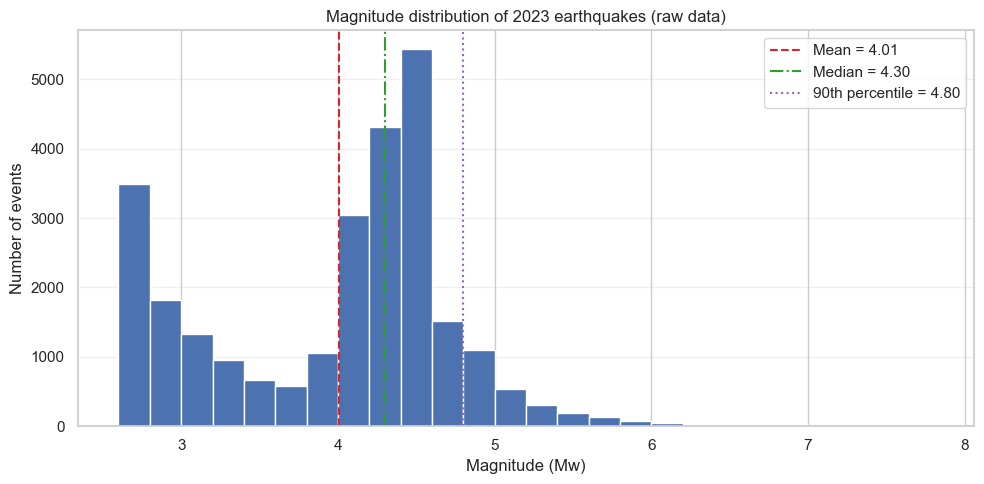

In [51]:

# --- magnitude distribution ---
mag = eq_df["mag"].dropna()

bin_width = 0.2
mag_min = mag.min()
mag_max = mag.max()
bins = np.arange(mag_min, mag_max + bin_width, bin_width)
fig, ax = plt.subplots(figsize=(10, 5))
ax.hist(mag, bins=bins)

mag_mean = mag.mean()
mag_median = mag.median()
mag_p90 = np.percentile(mag, 90)

ax.axvline(mag_mean, color="tab:red", linestyle="--", linewidth=1.5, label=f"Mean = {mag_mean:.2f}")
ax.axvline(mag_median, color="tab:green", linestyle="-.", linewidth=1.5, label=f"Median = {mag_median:.2f}")
ax.axvline(mag_p90, color="tab:purple", linestyle=":", linewidth=1.5, label=f"90th percentile = {mag_p90:.2f}")

ax.set_xlabel("Magnitude (Mw)")
ax.set_ylabel("Number of events")
ax.set_title("Magnitude distribution of 2023 earthquakes (raw data)")
ax.legend(loc="upper right")
ax.grid(axis="y", alpha=0.3)

plt.tight_layout()
plt.show()


**Figure 1. Magnitude distribution.**

**2.3.7 Global depth distribution**

Focal depths are summarised using a histogram to show the typical depth range and the presence of deeper events. For readability, depths are clipped at the 99.5th percentile in the plot to avoid extreme values stretching the x-axis. This clipping is a visualisation choice and does not apply to cleaning.

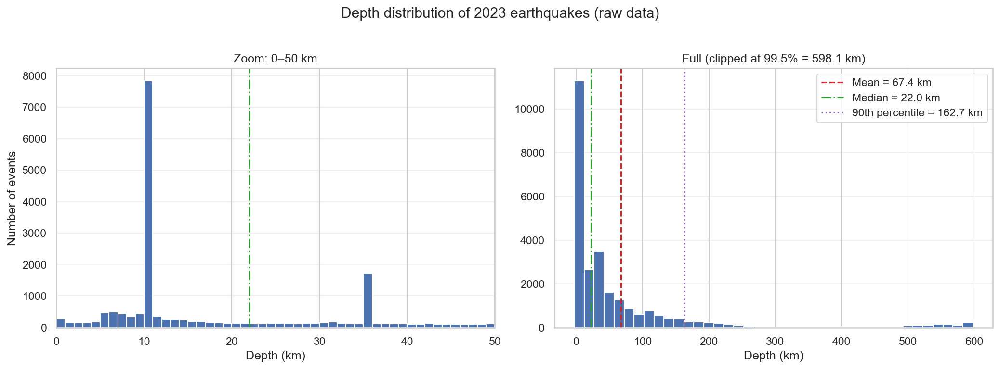

In [52]:
import numpy as np
import matplotlib.pyplot as plt

# --- depth distribution ---
depth = eq_df["depth"].dropna()

# (optional) if your dataset has many 0-depth placeholders, consider:
# depth = depth[depth > 0]

clip_val = np.percentile(depth, 99.5)
depth_plot = depth.clip(upper=clip_val)

depth_mean = depth_plot.mean()
depth_median = depth_plot.median()
depth_p90 = np.percentile(depth_plot, 90)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5), dpi=150)

# Left: zoom into shallow depths (0–50 km)
zoom_max = 50
bins_zoom = np.arange(0, zoom_max + 1, 1)  # 1 km bins for clarity
ax1.hist(depth_plot[depth_plot <= zoom_max], bins=bins_zoom)
ax1.set_xlim(0, zoom_max)
ax1.set_xlabel("Depth (km)")
ax1.set_ylabel("Number of events")
ax1.set_title("Zoom: 0–50 km")
ax1.grid(axis="y", alpha=0.3)

# Right: full clipped distribution
ax2.hist(depth_plot, bins=40)
ax2.set_xlabel("Depth (km)")
ax2.set_title(f"Full (clipped at 99.5% = {clip_val:.1f} km)")
ax2.grid(axis="y", alpha=0.3)

# Add the same reference lines to both
for ax in (ax1, ax2):
    ax.axvline(depth_mean, color="tab:red", linestyle="--", linewidth=1.5, label=f"Mean = {depth_mean:.1f} km")
    ax.axvline(depth_median, color="tab:green", linestyle="-.", linewidth=1.5, label=f"Median = {depth_median:.1f} km")
    ax.axvline(depth_p90, color="tab:purple", linestyle=":", linewidth=1.5, label=f"90th percentile = {depth_p90:.1f} km")

ax2.legend(loc="upper right")
fig.suptitle("Depth distribution of 2023 earthquakes (raw data)", y=1.02)
plt.tight_layout()
plt.show()


**Figure 2. Depth distribution.**

**2.3.8 Global spatial scatter sanity check**

A global epicentre scatter plot is used as a coordinate sanity check. Points should fall within valid latitude/longitude ranges and clustering should broadly align with known tectonic boundaries. Apparent hotspots should be interpreted with caution because coverage and detection thresholds vary geographically.

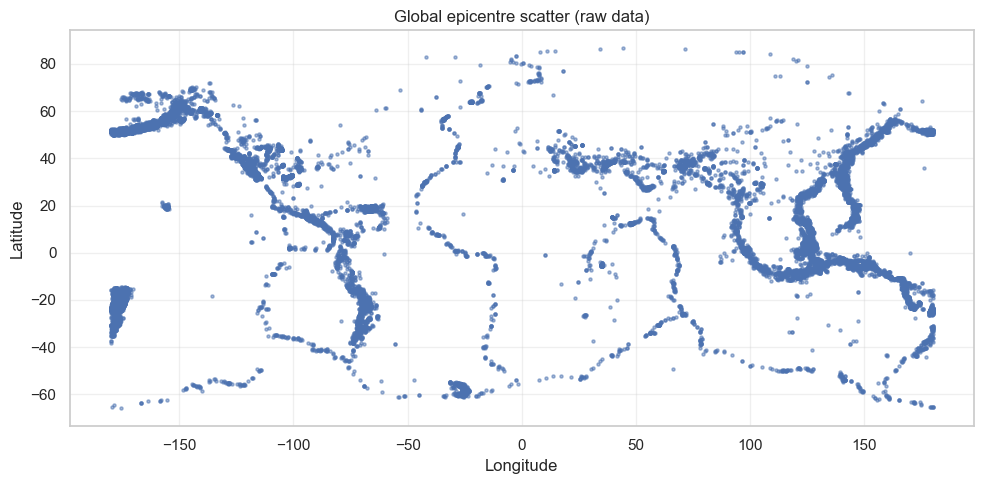

In [53]:

# --- epicentre scatter ---
lat = eq_df["latitude"].dropna()
lon = eq_df["longitude"].dropna()

fig, ax = plt.subplots(figsize=(10, 5))
ax.scatter(lon, lat, s=5, alpha=0.5)

ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.set_title("Global epicentre scatter (raw data)")
ax.grid(alpha=0.3)

plt.tight_layout()
plt.show()


**Figure 3. Global epicentre distribution.**

**2.3.9 Event type distribution**

The event-type distribution is reviewed to identify non-earthquake records in the raw catalogue. These non-earthquake event types are expected to bias magnitude and depth summaries if retained. The cleaning pipeline therefore filters to earthquake records only.

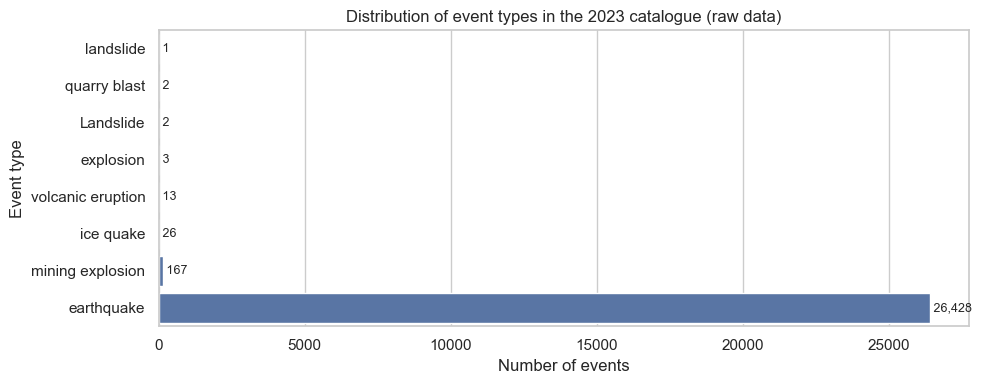

In [54]:
# --- distribution of event types ---
type_counts = (
    eq_df["type"]
    .value_counts(dropna=False)
    .sort_values(ascending=True)
)

n_types = len(type_counts)
fig_height = max(4, 0.4 * n_types)

fig, ax = plt.subplots(figsize=(10, fig_height))
sns.barplot(y=type_counts.index, x=type_counts.values, orient="h", ax=ax)

ax.set_xlabel("Number of events")
ax.set_ylabel("Event type")
ax.set_title("Distribution of event types in the 2023 catalogue (raw data)")

for i, count in enumerate(type_counts.values):
    ax.text(count, i, f" {count:,}", va="center", ha="left", fontsize=9)

plt.tight_layout()
plt.show()


**Figure 4. Event-type distribution.**

---

## 3. Cleaning Pipeline

Reliable analysis requires consistent, physically plausible records. The raw dataset included nuclear explosions, quarry blasts and other similar events.  These were removed to focus analysis on Earthquakes.  Earthquakes cannot be physically deeper than 700km.  Therefore any larger record in the depth field is assumed to be a sensor error. The pipeline also removes duplicates and conflicting IDs, coerces key fields(converts into numerical data if relevant or NaN if not) and standardises timestamps to UTC.



In [55]:


def clean_data(df, return_audit=False):
    """Clean the raw earthquake DataFrame: deduplicate records, coerce key fields,
    enforce physical bounds, and drop non earthquake event types. Returns a copy
    ready for downstream feature engineering."""
    df = df.copy()
    audit_rows = []

    def log_step(step, before, after, reason):
        removed = before - after
        removed_pct = (removed / before * 100) if before else 0
        audit_rows.append({
            "step": step,
            "n_before": before,
            "n_after": after,
            "removed": removed,
            "removed_pct": round(removed_pct, 2),
            "reason": reason,
        })

    # Drop exact duplicate rows first to get a stable baseline for all subsequent filters.
    before = len(df)
    df = df.drop_duplicates()
    log_step(
        "Drop exact duplicates",
        before,
        len(df),
        "Remove identical rows to avoid double-counting.",
    )
    print(f"Removed {before - len(df)} exact duplicate rows.")

    # Parse timestamps; invalid strings become NaT so date filters and sorting stay reliable.
    df["time"] = pd.to_datetime(df["time"], errors="coerce", utc=True)
    df["updated"] = pd.to_datetime(df["updated"], errors="coerce", utc=True)

    # If multiple records share an earthquake ID, keep the most recently updated record.
    before = len(df)
    df = (
        df.sort_values("updated")
        .drop_duplicates(subset="id", keep="last")
    )
    log_step(
        "Keep latest per ID",
        before,
        len(df),
        "Keep only the most recent revision for each event ID.",
    )
    print(f"Removed {before - len(df)} rows with duplicate earthquake based on IDs.")

    # Standardise numeric fields so physical filters behave predictably.
    for col in ["latitude", "longitude", "depth", "mag"]:
        df[col] = pd.to_numeric(df[col], errors="coerce")

    # Remove rows missing essential fields needed for downstream analysis.
    essential_cols = ["time", "latitude", "longitude", "depth", "mag"]
    before = len(df)
    df = df.dropna(subset=essential_cols)
    log_step(
        "Drop missing essentials",
        before,
        len(df),
        f"Remove rows missing {', '.join(essential_cols)}.",
    )
    print(f"Removed {before - len(df)} rows with missing essential earthquake information in {essential_cols}.")

    # Enforce physically plausible latitude/longitude/depth/magnitude ranges.
    before = len(df)
    valid_lat = df["latitude"].between(-90, 90)
    valid_lon = df["longitude"].between(-180, 180)
    # Depths beyond ~700 km are exceedingly rare; trimming deeper values removes likely sensor errors.
    valid_depth = df["depth"].between(0, 700)
    valid_mag = df["mag"].between(0, 10)
    df = df[valid_lat & valid_lon & valid_depth & valid_mag]
    log_step(
        "Filter physical ranges",
        before,
        len(df),
        "Enforce latitude/longitude/depth/magnitude bounds.",
    )
    print(f"Removed {before - len(df)} rows with invalid geographical ranges.")

    if "type" in df.columns:
        # Keep only earthquake events, dropping blasts/quarry events and other non earthquake records.
        before = len(df)
        df = df[df["type"] == "earthquake"]
        log_step(
            "Keep earthquake type",
            before,
            len(df),
            "Filter to events labeled as earthquakes only.",
        )
        print(f"Removed {before - len(df)} non earthquake events.")

    if return_audit:
        audit_df = pd.DataFrame(audit_rows)
        return df, audit_df

    return df


# Cleaning pipeline: operate on a copy, remove exact duplicates, coerce timestamps, keep the most
# recent record per earthquake ID, convert key numerics, drop rows missing essentials, enforce
# geographic and magnitude bounds, and retain only rows labeled as earthquakes to form a reliable
# base table.


clean_data removes duplicates or invalid rows, logging each deletion. This is to provide transparency and justify that the data hasn't been specifically to create the best model.  Statistically, as only 2% of the data is removed, this would not have a significant effect on the resulting models and removing instead of imputing can be justified.

In [56]:
from IPython.display import Markdown

print('Raw dataset shape:', eq_df.shape)

if "pipeline" in globals():
    pipeline.clean_fn = clean_data
    cleaned_result = pipeline.clean(eq_df, return_audit=True)
else:
    cleaned_result = clean_data(eq_df, return_audit=True)

if isinstance(cleaned_result, tuple):
    df_clean, cleaning_audit_df = cleaned_result
else:
    df_clean = cleaned_result
    cleaning_audit_df = pd.DataFrame()

cleaned_eq_df = df_clean

print('Cleaned dataset shape:', cleaned_eq_df.shape)
cleaned_eq_df.info()
preview_table(cleaned_eq_df)

if isinstance(cleaning_audit_df, pd.DataFrame) and not cleaning_audit_df.empty:
    audit_display = cleaning_audit_df.copy()
    audit_display.columns = [c.replace('_', ' ') for c in audit_display.columns]
    display(Markdown("**Table 3. Cleaning audit summary**"))
    display(audit_display)
    cleaning_audit_path = TABLES_DIR / "cleaning_audit.csv"
    cleaning_audit_df.to_csv(cleaning_audit_path, index=False)
    print(f"Saved cleaning audit to {cleaning_audit_path}")

cleaned_csv_path = PROCESSED_DIR / "Earthquakes 2023 clean.csv"
cleaned_eq_df.to_csv(cleaned_csv_path, index=False)
print(f"Saved cleaned dataset to {cleaned_csv_path}")

strong_mask = cleaned_eq_df.get('is_strong_quake', cleaned_eq_df['mag'] >= 6.0)
strong_count = int(strong_mask.sum())
class_summary = pd.DataFrame({
    'Cleaned Records': [len(cleaned_eq_df)],
    'Strong Quakes (>=6.0)': [strong_count],
})
class_summary['Percentage Strong'] = (class_summary['Strong Quakes (>=6.0)'] / class_summary['Cleaned Records'] * 100).round(2)
print("\nClass balance after cleaning:")
display(Markdown("**Table 4. Class balance after cleaning**"))
display(class_summary)


Raw dataset shape: (26642, 22)
Removed 1960 exact duplicate rows.
Removed 0 rows with duplicate earthquake based on IDs.
Removed 0 rows with missing essential earthquake information in ['time', 'latitude', 'longitude', 'depth', 'mag'].
Removed 43 rows with invalid geographical ranges.
Removed 207 non earthquake events.
Cleaned dataset shape: (24432, 22)
<class 'pandas.core.frame.DataFrame'>
Index: 24432 entries, 19 to 18434
Data columns (total 22 columns):
 #   Column           Non-Null Count  Dtype              
---  ------           --------------  -----              
 0   time             24432 non-null  datetime64[ns, UTC]
 1   latitude         24432 non-null  float64            
 2   longitude        24432 non-null  float64            
 3   depth            24432 non-null  float64            
 4   mag              24432 non-null  float64            
 5   magType          24432 non-null  object             
 6   nst              23051 non-null  float64            
 7   gap         

**Table 3. Cleaning audit summary**

,step,n before,n after,removed,removed pct,reason
0,Drop exact duplicates,26642,24682,1960,7.36,Remove identical rows to avoid double-counting.
1,Keep latest per ID,24682,24682,0,0.00,Keep only the most recent revision for each ev...
2,Drop missing essentials,24682,24682,0,0.00,"Remove rows missing time, latitude, longitude,..."
3,Filter physical ranges,24682,24639,43,0.17,Enforce latitude/longitude/depth/magnitude bou...
4,Keep earthquake type,24639,24432,207,0.84,Filter to events labeled as earthquakes only.


Saved cleaning audit to C:\Users\penso\Python_earthquake_analysis\Data\Processed\Tables\cleaning_audit.csv
Saved cleaned dataset to C:\Users\penso\Python_earthquake_analysis\Data\Processed\Earthquakes 2023 clean.csv

Class balance after cleaning:


**Table 4. Class balance after cleaning**

,Cleaned Records,Strong Quakes (>=6.0),Percentage Strong
0,24432,146,0.6


**3.1: Cleaning impact and class balance**

After cleaning, 24,432 Earthquakes remain, with only 146 at magnitude 6 or higher (considered in this analysis as 'strong'). This class imbalance is a key focus of the modelling process and justifies the use of class weighting and recall further down the line. 

The minimal data loss suggests that the raw dataset was already of a high quality.This cleaned dataset is now ready for the feature engineering stage where more features will be added to enrich the dataset.

---

## 4. Feature Engineering

With the data cleaning phase complete, the project moves on to feature engineering stage where features are added to give the model further context to understand the physics of Earthquakes.
Feature engineering expands the cleaned dataset with temporal(time), spatial(location), severity, and quality descriptors.  



### 4.1 Design of the `engineer_features()` Function

Each engineered feature maps to a clear seismological concept (depth class, severity, time-of-day, region) and is paired with readable labels for plots and modelling. The design avoids target leakage(allowing the model to use the results it is supposed to be predicting) by excluding raw magnitude and derived energy terms from predictors.

Raw coordinates (longitude, latitude, depth) are not enough for a machine learning model to find complex patterns.  

1. gap(sensor coverage) and rms(location error) are highly correlated. If both are used in a machine learning model, it could cause the multicollinearity problem and make the Maths less reliable. These numbers have been combined into a single quality_score.

2. Using a numerical field for depth analysis could lead to the raw numbers being treated equally.  For example, the difference between 10km and 20km could make a huge difference in the results, however the difference between 600km and 610km is not likely to make that much difference to the results.  Therefore, to force the model to learn from tectonic zones rather than raw numbers, depth_category was created with shallow, intermediate and deep.

3. Magnitude is logarithmic.  Therefore, a mag 6.0 Earthquake is much more than double the stength of a 3.0 Earthquake. The energy_proxy feature, representing the energy release, makes it easier for the model to distinguish the size of the earthquake.

In [57]:


import numpy as np
import pandas as pd
from pandas.api.types import is_datetime64_any_dtype, CategoricalDtype

def engineer_features(df: "pd.DataFrame") -> "pd.DataFrame":
    """Engineer temporal, physical, geographical, and data-quality features from the cleaned earthquake dataframe."""
    df = df.copy()


    if not is_datetime64_any_dtype(df["time"]):
        df["time"] = pd.to_datetime(df["time"], errors="coerce", utc=True)

    dt = df["time"].dt
    df["time_str"] = dt.strftime("%Y-%m-%d %H:%M:%S")
    df["year"] = dt.year
    df["month"] = dt.month
    df["month_name"] = dt.month_name()
    df["day"] = dt.day
    df["day_of_week"] = dt.dayofweek
    df["day_name"] = dt.day_name()
    df["hour"] = dt.hour
    df["is_weekend"] = df["day_of_week"].isin([5, 6])

    def hour_to_part(h):
        if h < 6:   return "night"
        if h < 12:  return "morning"
        if h < 18:  return "afternoon"
        return "evening"
    df["part_of_day"] = df["hour"].apply(hour_to_part)

    def month_to_season(m):
        if m in (12, 1, 2):  return "winter"
        if m in (3, 4, 5):   return "spring"
        if m in (6, 7, 8):   return "summer"
        return "autumn"
    df["season"] = df["month"].apply(month_to_season)


    depth_cat_type = CategoricalDtype(categories=["shallow", "intermediate", "deep"], ordered=True)
    mag_cat_type = CategoricalDtype(categories=["minor", "light", "moderate", "strong", "major", "great", "massive"], ordered=True)
    df["depth_category"] = pd.cut(
        df["depth"],
        bins=[0, 70, 300, 700],
        labels=depth_cat_type.categories,
        right=False
    ).astype(depth_cat_type)
    df["mag_category"] = pd.cut(
        df["mag"],
        bins=[0, 3, 4, 5, 6, 7, 8, 10],
        labels=mag_cat_type.categories,
        right=False
    ).astype(mag_cat_type)
    df["is_strong_quake"] = df["mag"] >= 6.0
    df["energy_log10_J"] = 1.5 * df["mag"] + 4.8


    df["abs_latitude"] = df["latitude"].abs()
    df["abs_longitude"] = df["longitude"].abs()
    df["distance_from_equator_km"] = df["abs_latitude"] * 111.0
    df["distance_from_prime_meridian_km"] = (
        df["abs_longitude"] * 111.0 * np.cos(np.deg2rad(df["latitude"]))
    )
    df["hemisphere_NS"] = np.where(df["latitude"] >= 0, "north", "south")
    df["hemisphere_EW"] = np.where(df["longitude"] >= 0, "east", "west")

    def classify_region(lon):
        if lon < -100: return "Americas_west"
        if lon < -30:  return "Americas_east_Atlantic"
        if lon < 60:   return "Europe_Africa"
        if lon < 150:  return "Asia_WestPacific"
        return "Pacific_Oceania"
    df["broad_region"] = df["longitude"].apply(classify_region)


    for col in ["depthError", "magError", "horizontalError"]:
        if col in df.columns:
            df[f"has_{col}"] = df[col].notna()

    norm_cols = []
    for col in ["gap", "rms", "depthError", "magError", "horizontalError"]:
        if col in df.columns:
            mn, mx = df[col].min(), df[col].max()
            if pd.notna(mn) and pd.notna(mx) and mn != mx:
                norm_name = f"{col}_norm"
                df[norm_name] = (df[col] - mn) / (mx - mn)
                norm_cols.append(norm_name)
    if norm_cols:
        df["quality_score"] = 1 - df[norm_cols].mean(axis=1)


    category_types = {
        "depth_category": depth_cat_type,
        "mag_category": mag_cat_type,
        "hemisphere_NS": CategoricalDtype(categories=["north", "south"]),
        "hemisphere_EW": CategoricalDtype(categories=["east", "west"]),
        "broad_region": CategoricalDtype(categories=["Americas_west", "Americas_east_Atlantic", "Europe_Africa", "Asia_WestPacific", "Pacific_Oceania"]),
        "part_of_day": CategoricalDtype(categories=["night", "morning", "afternoon", "evening"], ordered=True),
        "season": CategoricalDtype(categories=["winter", "spring", "summer", "autumn"], ordered=True),
    }
    for col, cat_type in category_types.items():
        if col in df.columns:
            df[col] = df[col].astype(cat_type)

    for c in category_types:
        if c in df.columns and hasattr(df[c], "cat"):
            cat_series = df[c]
            if "unknown" not in cat_series.cat.categories:
                cat_series = cat_series.cat.add_categories(["unknown"])
            df[c] = cat_series
            df[f"{c}_code"] = cat_series.fillna("unknown").cat.codes

    return df


# Feature engineering steps: add temporal fields (year, month, season, part of day), physical
# severity (depth and magnitude categories, energy proxy, strong flag), geographic context
# (hemispheres, coarse region, distances to equator and prime meridian), data-quality signals
# (error presence, normalized scores, composite quality), and categorical encodings for modelling.


if "pipeline" in globals():
    pipeline.engineer_fn = engineer_features


The engineer_features() block adds important details about time, location and quality to improve comparisons without adapting any of the original data. However, rely on broad geographical coordinates which limits the locational accuracy.

### 4.2 Engineered Feature Schema Summary

In [58]:

if "pipeline" in globals():
    pipeline.engineer_fn = engineer_features
    df_feat = pipeline.engineer(cleaned_eq_df)
else:
    df_feat = engineer_features(cleaned_eq_df)

featured_eq_df = df_feat

schema_groups = {
    "Temporal": ["year", "month", "season", "part_of_day", "is_weekend"],
    "Physical": ["depth_category", "mag_category", "is_strong_quake", "energy_log10_J"],
    "Spatial": ["hemisphere_NS", "hemisphere_EW", "broad_region", "distance_from_equator_km"],
    "Quality": ["quality_score", "gap_norm", "rms_norm", "has_depthError"],
    "ML Encodings": ["depth_category_code", "mag_category_code", "season_code", "part_of_day_code"],
}

print("Engineered Feature Schema Summary\n(showing only columns present in featured_eq_df)\n")

for group, cols in schema_groups.items():
    present = [c for c in cols if c in featured_eq_df.columns]
    missing = [c for c in cols if c not in featured_eq_df.columns]

    print(f"## {group} ({len(present)}/{len(cols)} present)")
    if present:
        dtypes = featured_eq_df[present].dtypes.astype(str)
        for c in present:
            na = int(featured_eq_df[c].isna().sum())
            print(f"  - {c}: {dtypes[c]} (missing={na})")
    else:
        print("  (none present)")

    if missing:
        print(f"  Missing (not in df): {missing}")
    print()

Engineered Feature Schema Summary
(showing only columns present in featured_eq_df)

## Temporal (5/5 present)
  - year: int32 (missing=0)
  - month: int32 (missing=0)
  - season: category (missing=0)
  - part_of_day: category (missing=0)
  - is_weekend: bool (missing=0)

## Physical (4/4 present)
  - depth_category: category (missing=0)
  - mag_category: category (missing=0)
  - is_strong_quake: bool (missing=0)
  - energy_log10_J: float64 (missing=0)

## Spatial (4/4 present)
  - hemisphere_NS: category (missing=0)
  - hemisphere_EW: category (missing=0)
  - broad_region: category (missing=0)
  - distance_from_equator_km: float64 (missing=0)

## Quality (4/4 present)
  - quality_score: float64 (missing=0)
  - gap_norm: float64 (missing=1382)
  - rms_norm: float64 (missing=0)
  - has_depthError: bool (missing=0)

## ML Encodings (4/4 present)
  - depth_category_code: int8 (missing=0)
  - mag_category_code: int8 (missing=0)
  - season_code: int8 (missing=0)
  - part_of_day_code: int8 (m

### 4.3 Feature Engineering Pipeline

**Table 5. Engineered dataset preview.**

In [59]:

print("Applying feature engineering to cleaned_eq_df...")

original_columns = list(cleaned_eq_df.columns)

if "pipeline" in globals():
    pipeline.engineer_fn = engineer_features
    df_feat = pipeline.engineer(cleaned_eq_df)
else:
    df_feat = engineer_features(cleaned_eq_df)

featured_eq_df = df_feat

print("=== Dataset Shape Comparison ===")
print(f"Before feature engineering : {cleaned_eq_df.shape}")
print(f"After feature engineering  : {featured_eq_df.shape}")

new_cols = [c for c in featured_eq_df.columns if c not in original_columns]

print(f"Number of engineered features added: {len(new_cols)}")
print("Sample of engineered feature names (first 20):")
for c in sorted(new_cols)[:20]:
    print(f"  - {c}")

print("Preview of engineered dataframe:")
preview_table(featured_eq_df)


# Run the feature pipeline on the cleaned dataset; compare shapes before/after, count newly added
# columns, sample their names, and preview rows to confirm readiness for Section 5 (EDA) and Section 6 (modelling) analyses.


Applying feature engineering to cleaned_eq_df...
=== Dataset Shape Comparison ===
Before feature engineering : (24432, 22)
After feature engineering  : (24432, 60)
Number of engineered features added: 38
Sample of engineered feature names (first 20):
  - abs_latitude
  - abs_longitude
  - broad_region
  - broad_region_code
  - day
  - day_name
  - day_of_week
  - depthError_norm
  - depth_category
  - depth_category_code
  - distance_from_equator_km
  - distance_from_prime_meridian_km
  - energy_log10_J
  - gap_norm
  - has_depthError
  - has_horizontalError
  - has_magError
  - hemisphere_EW
  - hemisphere_EW_code
  - hemisphere_NS
Preview of engineered dataframe:


,time,latitude,longitude,depth,mag,magType,nst,gap,dmin,rms,...,magError norm,horizontalError norm,quality score,depth category code,mag category code,hemisphere NS code,hemisphere EW code,broad region code,part of day code,season code
19,2023-01-01 09:04:40.710000+00:00,17.830333,-65.985500,10.92,2.78,md,8.0,245.0,0.177300,0.14,...,0.028210,0.008788,0.837641,0,0,0,1,1,1,0
22,2023-01-01 10:09:37.830000+00:00,18.206500,-67.117333,21.88,2.95,md,26.0,97.0,0.005188,0.13,...,0.041231,0.002727,0.924656,0,0,0,1,1,1,0
53,2023-01-01 23:56:53.930000+00:00,19.360100,-65.725600,34.00,3.62,md,14.0,270.0,1.110400,0.44,...,0.017817,0.036768,0.703399,0,1,0,1,1,3,0
65,2023-01-02 04:15:00.130000+00:00,17.947833,-66.908500,12.69,2.80,md,22.0,192.0,0.038830,0.13,...,0.021568,0.003434,0.873287,0,0,0,1,1,0,0
79,2023-01-02 06:56:51.300000+00:00,17.946333,-67.008500,10.55,2.88,md,5.0,230.0,0.113300,0.17,...,0.023183,0.012828,0.842688,0,0,0,1,1,1,0


After running the pipeline, shapes and previews confirm only columns changed and no rows were dropped, supporting reproducibility. The dashboard then provides a high-level sanity check of the engineered distributions.

The results confirms further that new features were, indeed, added without losing any more data rows. The dashboard gives us a quick visual check to ensure the data looks realistic.

These checks create an audit trail so later model shifts can be traced back to feature design rather than accidentally deleted data.

### 4.4 Overview of Engineered Feature Groups

The dashboard aggregates seasonality, magnitude mix, regional counts, and quality distributions to validate engineered features and identify any clear errors before moving to more detailed analysis.

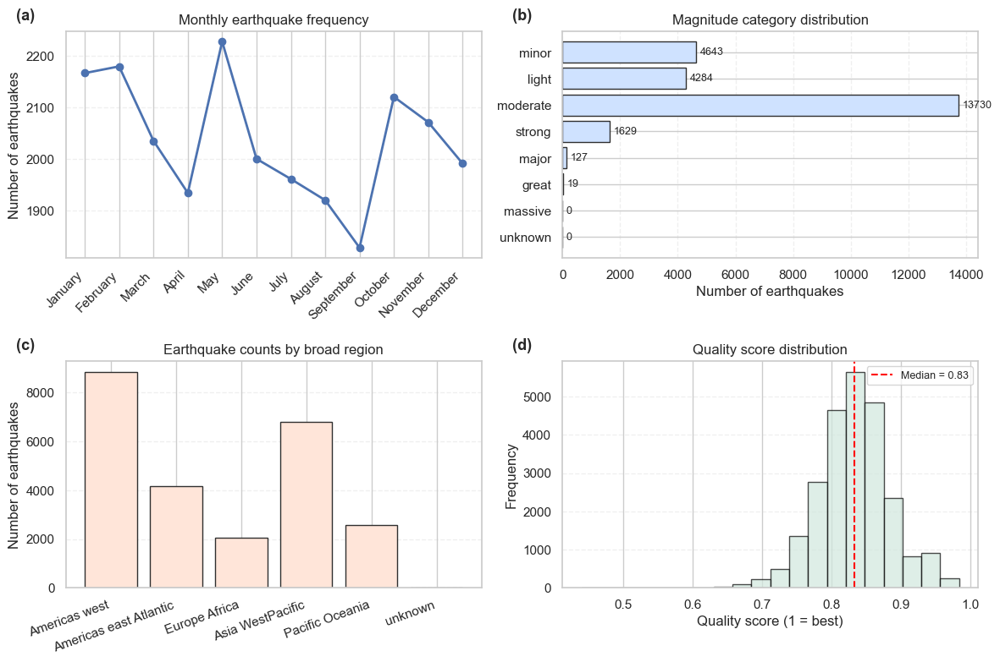

In [60]:

plt = libs.plt
np = libs.np

fig, axes = plt.subplots(2, 2, figsize=(12, 8))
axes = axes.ravel()
labels = ['(a)', '(b)', '(c)', '(d)']


order_months = [
    "January","February","March","April","May","June",
    "July","August","September","October","November","December"
]
month_counts = (
    featured_eq_df["month_name"]
    .value_counts()
    .reindex(order_months)
    .fillna(0)
)
x = np.arange(len(order_months))
axes[0].plot(x, month_counts.values, marker="o", linewidth=2)
axes[0].set_title("Monthly earthquake frequency", fontsize=12)
axes[0].set_xticks(x)
axes[0].set_xticklabels(order_months, rotation=45, ha="right")
axes[0].set_ylabel("Number of earthquakes")
axes[0].grid(axis="y", linestyle="--", alpha=0.3)
axes[0].text(-0.12, 1.05, labels[0], transform=axes[0].transAxes,
             fontsize=13, fontweight="bold")


mag_counts = (
    featured_eq_df["mag_category"]
    .value_counts()
    .sort_index()
)
y_pos = np.arange(len(mag_counts))
axes[1].barh(y_pos, mag_counts.values, color="#cfe2ff", edgecolor="#2f2f2f")
axes[1].set_yticks(y_pos)
axes[1].set_yticklabels(mag_counts.index.astype(str))
axes[1].invert_yaxis()
axes[1].set_title("Magnitude category distribution", fontsize=12)
axes[1].set_xlabel("Number of earthquakes")
axes[1].grid(axis="x", linestyle="--", alpha=0.3)
axes[1].text(-0.12, 1.05, labels[1], transform=axes[1].transAxes,
             fontsize=13, fontweight="bold")
for i, v in enumerate(mag_counts.values):
    axes[1].text(v + mag_counts.values.max()*0.01, i, str(v),
                 va="center", fontsize=9)


region_counts = (
    featured_eq_df["broad_region"]
    .value_counts()
    .sort_index()
)
x2 = np.arange(len(region_counts))
axes[2].bar(x2, region_counts.values, color="#ffe5d9", edgecolor="#2f2f2f")
axes[2].set_xticks(x2)
region_labels = [label.replace("_", " ") for label in region_counts.index.astype(str)]
axes[2].set_xticklabels(region_labels, rotation=20, ha="right")
axes[2].set_title("Earthquake counts by broad region", fontsize=12)
axes[2].set_ylabel("Number of earthquakes")
axes[2].grid(axis="y", linestyle="--", alpha=0.3)
axes[2].text(-0.12, 1.05, labels[2], transform=axes[2].transAxes,
             fontsize=13, fontweight="bold")


ax = axes[3]
if "quality_score" in featured_eq_df.columns:
    qs = featured_eq_df["quality_score"].dropna()
    ax.hist(qs, bins=20, edgecolor="black", alpha=0.7, color="#d1e7dd")
    median_qs = qs.median()
    ax.axvline(median_qs, color="red", linestyle="--", linewidth=1.5,
               label=f"Median = {median_qs:.2f}")
    ax.set_title("Quality score distribution", fontsize=12)
    ax.set_xlabel("Quality score (1 = best)")
    ax.set_ylabel("Frequency")
    ax.grid(axis="y", linestyle="--", alpha=0.3)
    ax.legend(fontsize=9)
else:
    ax.text(0.5, 0.5, "Quality score not available",
            ha="center", va="center", fontsize=11)
    ax.axis("off")
ax.text(-0.12, 1.05, labels[3], transform=ax.transAxes,
        fontsize=13, fontweight="bold")

plt.tight_layout()
plt.show()


# Four-panel overview: (a) monthly seasonality, (b) magnitude category distribution, (c) counts by
# broad region, and (d) data-quality distribution. Provides a dashboard snapshot before deeper
# dimension-specific analysis.



**Figure 5. Engineered feature groups overview.**


The dashboard condenses key indicators into a global overview that is useful for sanity checks but can hide regional differences. The following visuals therefore examine more specific details.

The number of earthquakes each month is fairly consistent and most are small. Despite the data quality being good, these patterns are clearly shaped by where the sensors are located. Therefore, it is acknowledged that having more quakes in a locations list does not necessarily mean it is more dangerous but that it is better monoitored with sensor data - known as sampling bias.

### 4.5 Additional Feature Level Visualisations

Before modeling or analysis, a final check is shown to confirm the following:

1. depth_category has separated the data meaningfully into useable groups.
2. energy_proxy effectively captures the scale of energy released between Earthquakes of different magnitudes

#### 4.5.1 Magnitude severity profile

The magnitude category plot highlights that small earthquakes are far more common than strong ones in an easier to read format than the raw data.

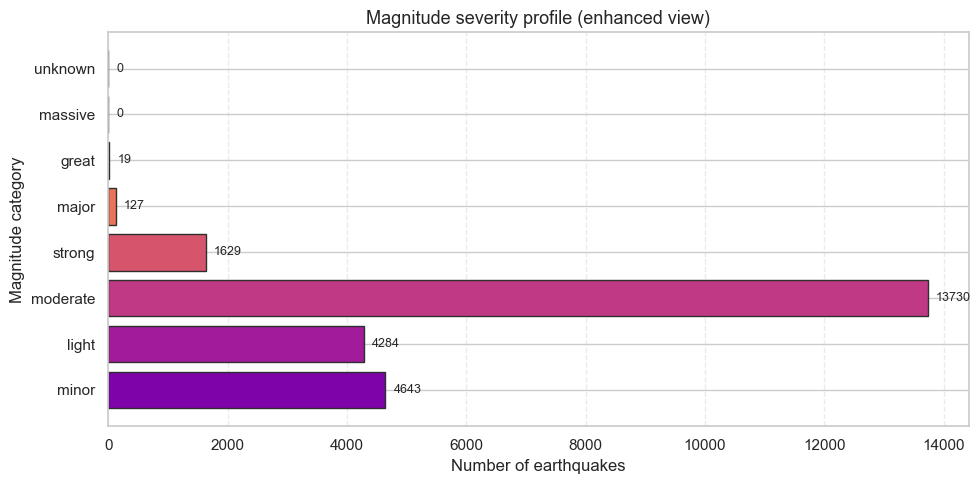

In [61]:

plt = libs.plt
np = libs.np

mag_counts = (
    featured_eq_df["mag_category"]
    .value_counts()
    .sort_index()
)

colors = plt.cm.plasma(np.linspace(0.25, 0.95, len(mag_counts)))

plt.figure(figsize=(10, 5))
plt.barh(
    mag_counts.index.astype(str),
    mag_counts.values,
    color=colors,
    edgecolor="#2f2f2f"
)

plt.title("Magnitude severity profile (enhanced view)", fontsize=13)
plt.xlabel("Number of earthquakes")
plt.ylabel("Magnitude category")
plt.grid(axis="x", linestyle="--", alpha=0.4)


for i, v in enumerate(mag_counts.values):
    plt.text(
        v + max(mag_counts.values) * 0.01,
        i,
        str(v),
        va="center",
        fontsize=9
    )

plt.tight_layout()
plt.show()


# Magnitude severity profile: horizontal view of counts per seismological category to
# contextualise subsequent depth and regional comparisons.



**Figure 6. Magnitude severity profile.**


The dataset exhibits a heavy skew toward small events. This distribution validates the project's decision to classify them into group rather than predict exact sizes, which would be biased by the overwhelming number of small-sized quakes.



#### 4.5.2 Magnitude distribution by depth category

This visualisation compares magnitude distributions across shallow, intermediate, and deep classes to capture depth-related differences.

Violin plots highlights a clear structural difference: shallow events vary widely in magnitude range, while deep events cluster at lower magnitudes. The box plot section shows that the median value is similar across the categories, indicating that a 'typical' earthquake is small, regardless of the depth category. This distinction confirms that depth_category is a key predictor in the model. However, since events deeper underground are less precise, the analysis is cautious about drawing conclusions based on these factors.



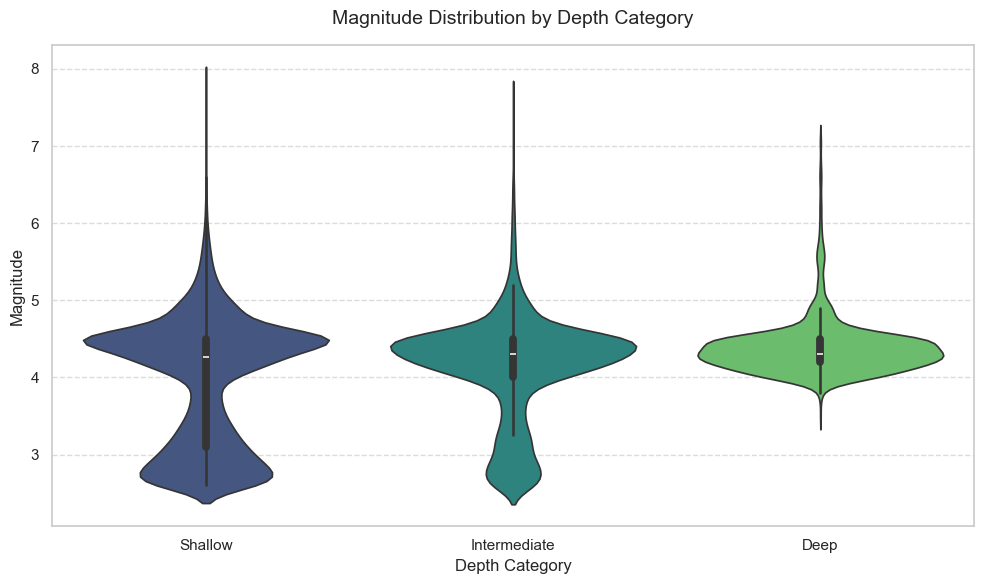

In [62]:
plt = libs.plt
sns = libs.sns
np = libs.np

def assign_depth_category(depth):
    if depth <= 70:
        return 'Shallow'
    elif depth <= 300:
        return 'Intermediate'
    else:
        return 'Deep'

if 'depth_category' not in eq_df.columns:
    eq_df['depth_category'] = eq_df['depth'].apply(assign_depth_category)

fig, ax = plt.subplots(figsize=(10, 6))

depth_order = ['Shallow', 'Intermediate', 'Deep']

sns.violinplot(
    data=eq_df,
    x='depth_category',
    y='mag',
    order=depth_order,
    palette='viridis',  
    inner='box',        
    ax=ax
)

ax.set_title('Magnitude Distribution by Depth Category', fontsize=14, pad=15)
ax.set_xlabel('Depth Category', fontsize=12)
ax.set_ylabel('Magnitude', fontsize=12)
ax.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

**Figure 7. Magnitude distribution by depth:**


#### 4.5.3 Global epicentre distribution with magnitude-depth

This map integrates location, depth, and magnitude to provide geographic context for severity patterns and sets up the more detailed epicentre analysis in Section 5.

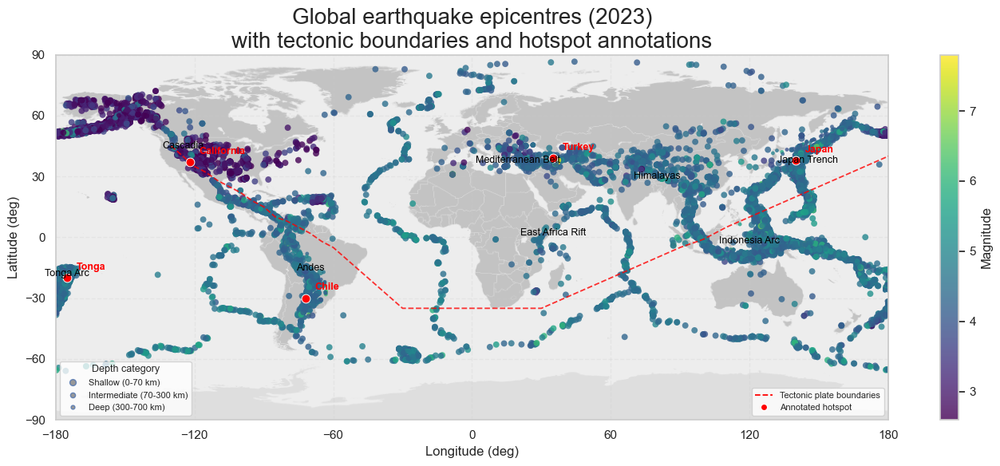

In [63]:

plt = libs.plt
mpimg = libs.mpimg
np = libs.np
pd = libs.pd
Line2D = libs.Line2D

map_path = libs.WORLD_MAP_FILE
plates_path = libs.PLATE_FILE

cropped_img = None
if mpimg is not None and map_path is not None and map_path.exists():
    try:
        img = mpimg.imread(map_path)
        rgb = img[:, :, :3]
        brightness = rgb.mean(axis=2)
        mask = brightness > 0.02
        if mask.any():
            rows = np.where(mask.any(axis=1))[0]
            cols = np.where(mask.any(axis=0))[0]
            cropped_img = np.clip(img[rows[0]:rows[-1], cols[0]:cols[-1]] * 0.9, 0, 1)
    except Exception as exc:
        print(f"Skipping background image: {exc}")
else:
    print("World map image not found; drawing map without a background image.")

plates = None
if plates_path is not None and plates_path.exists():
    try:
        plates = pd.read_csv(plates_path)
    except Exception as exc:
        print(f"Skipping plate boundary overlay: {exc}")
else:
    print("Plate boundary file not found; continuing without boundary overlay.")

size_map = {"shallow": 32, "intermediate": 20, "deep": 12}
marker_sizes = (
    featured_eq_df["depth_category"]
    .map(size_map)
    .astype(float)
    .fillna(14.0)
)

fig, ax = plt.subplots(figsize=(14, 6))

if cropped_img is not None:
    ax.imshow(
        cropped_img,
        extent=[-180, 180, -90, 90],
        aspect="auto",
        alpha=0.75,
        zorder=0,
    )

sc = ax.scatter(
    featured_eq_df["longitude"],
    featured_eq_df["latitude"],
    c=featured_eq_df["mag"],
    s=marker_sizes,
    alpha=0.8,
    cmap="viridis",
    edgecolors="none",
    zorder=2,
)

if plates is not None:
    ax.plot(
        plates["lon"], plates["lat"],
        color="red", linewidth=1.3, linestyle="--",
        alpha=0.8, zorder=3,
    )

hotspots = {
    "Japan": (140, 38),
    "Chile": (-72, -30),
    "Turkey": (35, 39),
    "Tonga": (-175, -20),
    "California": (-122, 37),
}

for name, (x, y) in hotspots.items():
    ax.scatter(x, y, s=60, c="red", edgecolors="white", linewidth=0.7, zorder=4)
    ax.text(
        x + 4, y + 4,
        name,
        fontsize=9,
        color="red",
        fontweight="bold",
        zorder=5,
    )

tectonic_labels = {
    "Andes": (-70, -15),
    "Cascadia": (-125, 45),
    "Mediterranean Belt": (20, 38),
    "Himalayas": (80, 30),
    "East Africa Rift": (35, 2),
    "Indonesia Arc": (120, -2),
    "Japan Trench": (145, 38),
    "Tonga Arc": (-175, -18),
}

for name, (lon, lat) in tectonic_labels.items():
    ax.text(
        lon, lat, name,
        fontsize=9, color="black",
        ha="center", va="center",
        alpha=1, zorder=4,
    )

ax.set_title(
    "Global earthquake epicentres (2023)\nwith tectonic boundaries and hotspot annotations",
    fontsize=20,
)
ax.set_xlabel("Longitude (deg)")
ax.set_ylabel("Latitude (deg)")
ax.set_xlim(-180, 180)
ax.set_ylim(-90, 90)
ax.set_xticks(np.arange(-180, 181, 60))
ax.set_yticks(np.arange(-90, 91, 30))
ax.grid(True, linestyle="--", alpha=0.25)

cbar = plt.colorbar(sc, ax=ax)
cbar.set_label("Magnitude")

depth_legend_elements = [
    Line2D([0], [0], marker='o', linestyle='', markersize=np.sqrt(size_map["shallow"]),
           label='Shallow (0-70 km)', markerfacecolor='grey', alpha=0.8),
    Line2D([0], [0], marker='o', linestyle='', markersize=np.sqrt(size_map["intermediate"]),
           label='Intermediate (70-300 km)', markerfacecolor='grey', alpha=0.8),
    Line2D([0], [0], marker='o', linestyle='', markersize=np.sqrt(size_map["deep"]),
           label='Deep (300-700 km)', markerfacecolor='grey', alpha=0.8),
]

depth_legend = ax.legend(
    handles=depth_legend_elements,
    title="Depth category",
    loc="lower left",
    fontsize=8,
    title_fontsize=9,
    frameon=True,
)
ax.add_artist(depth_legend)

boundary_hotspot_legend = ax.legend(
    handles=[
        Line2D([0], [0], color="red", linestyle="--", linewidth=1.3, label="Tectonic plate boundaries"),
        Line2D([0], [0], marker="o", linestyle="", markersize=6,
               markerfacecolor="red", markeredgecolor="white", label="Annotated hotspot"),
    ],
    loc="lower right",
    fontsize=8,
    frameon=True,
)

plt.tight_layout()
plt.show()

# World map composite: load optional background and plate-boundary overlays when available,
# crop and dim the map for clarity, overlay epicentres sized by depth bucket and colored by
# magnitude, annotate hotspots and tectonic provinces, and include legends for depth and
# boundary layers while remaining resilient if assets are missing.


**Figure 8. Epicentres with tectonic boundaries.**


### 4.6 Summary and Reflection

Feature engineering adds important details to the cleaned dataset. Temporal, spatial, severity, and quality indicators have been added without altering event rows. This enables deeper EDA and supports the classification models that follow. The design choices (depth categories and strong-event thresholds) gives clear direction for analysis.

---

## 5. Exploratory Data Analysis

This section synthesizes global spatial patterns, depth and magnitude structure, and regional contrasts to build a full picture of the data. The emphasis is on visible evidence: maps, distributions, correlations, and quality diagnostics that explain the shape of the data before modelling.


**5.1: Global tectonic context map**

The global map aligns epicentre locations with plate boundaries to anchor EDA in physical geography. However, the map can be seen as misleading; the clusters indicate areas with a higher number of sensors. To attempt to mitigate this bias, quantitative summaries follow to more accurately measure activity levels.

### 5.1 Global Patterns

These patterns show that most earthquakes are shallow and that they cluster around plate-boundaries. The diagnostics below check that these are real and not data errors:
1. Structure - Verifying whether magnitude and depth follow realistic physical patterns.
2. Coverage - Check if high activity is just due to more sensors
3. Time - Ensure that earthquake records have been consistent throughout the time period(2023)

In [64]:

print("Library availability (inline helper):")
print(libs.availability())


# Dependency status printout indicating which optional libraries are available to choose between
# interactive Plotly outputs and static matplotlib/seaborn fallbacks.



Library availability (inline helper):
{'HAS_MATPLOTLIB': True, 'HAS_SEABORN': True, 'HAS_PLOTLY': True, 'HAS_KALEIDO': True, 'HAS_SKLEARN': True, 'HAS_SCIPY': True}


**5.1.1: EDA dependency status**

Dependency checks ensure EDA outputs remain reproducible across environments, with interactive or static fallbacks as needed.

**5.1.2: Magnitude density by depth category (KDE)**


KDE curves indicate that shallow earthquakes show a broad range of magnitudes, whereas deep events form tighter, lower-magnitude clusters. Note that the smoothing in this method presents these as general trends rather than precise counts. 

The significant overlap between these curves proves that depth alone cannot be the only feature to identify strong events. This justifies the project's move to multivariate modeling, which will integrate depth, location, and quality metrics.


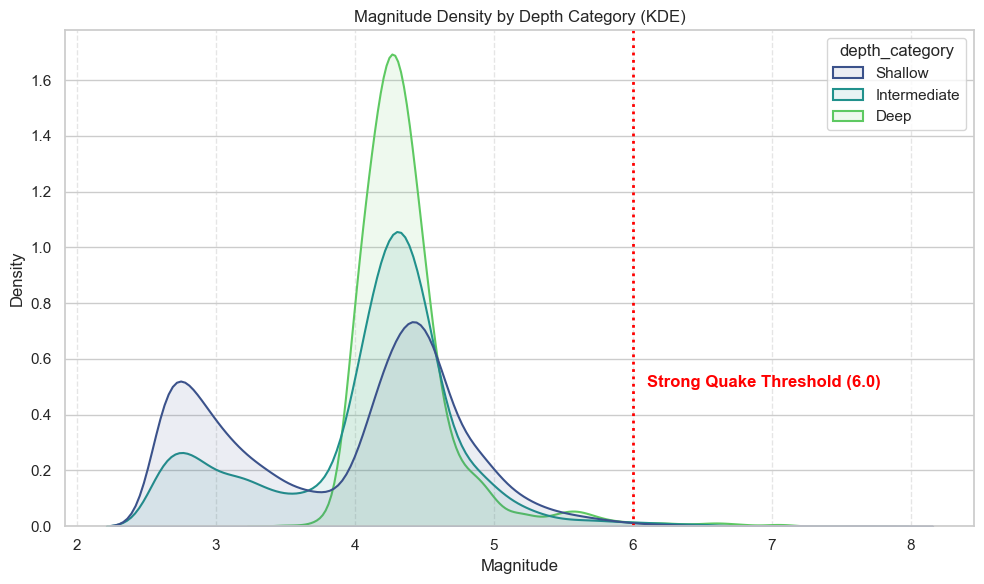

In [65]:
plt = libs.plt
sns = libs.sns

featured_eq_df['depth_category'] = featured_eq_df['depth_category'].str.capitalize()
depth_order = ['Shallow', 'Intermediate', 'Deep']

fig, ax = plt.subplots(figsize=(10, 6))

sns.kdeplot(
    data=featured_eq_df,
    x='mag',
    hue='depth_category',
    hue_order=depth_order,
    palette='viridis',
    common_norm=False,   
    linewidth=1.5,        
    fill=True,           
    alpha=0.1,          
    ax=ax
)

ax.axvline(6.0, color='red', linestyle=':', linewidth=2)
ax.text(x=6.1, y=0.5, s="Strong Quake Threshold (6.0)", color='red', fontweight='bold')

ax.set_title('Magnitude Density by Depth Category (KDE)')
ax.set_xlabel('Magnitude')
ax.set_ylabel('Density')
ax.grid(axis='x', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

**Figure 9. Magnitude Density by Depth Category (KDE):**  
The density curves show shallow earthquakes span the full magnitude spectrum, deep events are statistically confined to lower intensities and rarely cross the 'Strong quake' threshold (M≥6.0).

**5.1.3: Depth distribution sanity check**

Depth histograms confirm shallow dominance and validate the rules set out in the cleaning pipeline. However, deeper events are rare and therefore harder to predict(because there is not enough of this data to identify patterns in this way). Station-coverage metrics add some context and give the analysis a confirmation as to whether these events are real or just data errors.

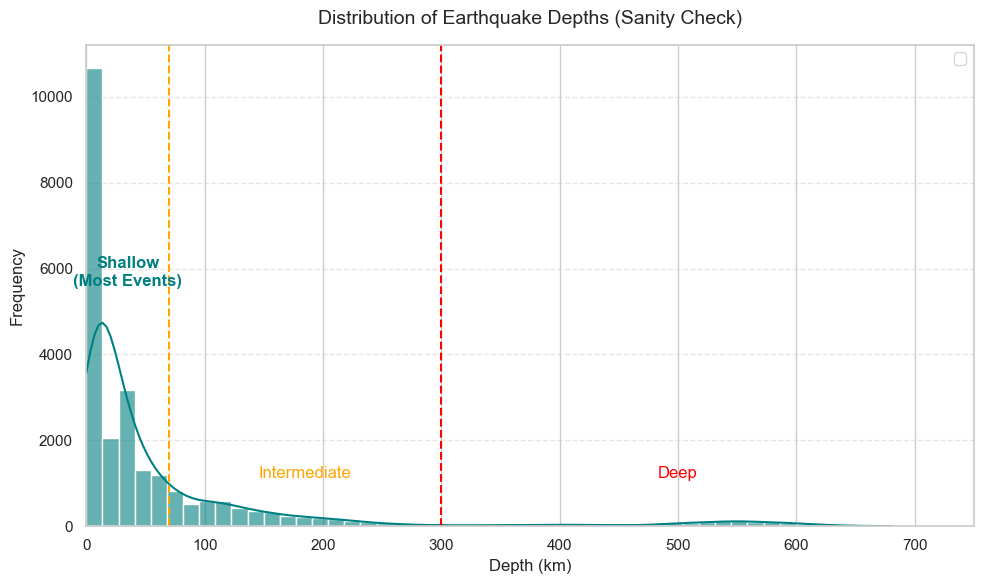

In [66]:
plt = libs.plt
sns = libs.sns

fig, ax = plt.subplots(figsize=(10, 6))

sns.histplot(
    data=featured_eq_df,
    x='depth',
    bins=50,             
    kde=True,
    color='teal',        
    alpha=0.6,
    edgecolor=None,
    ax=ax
)

ax.axvline(70, color='orange', linestyle='--', linewidth=1.5)
ax.axvline(300, color='red', linestyle='--', linewidth=1.5)

ax.text(35, ax.get_ylim()[1]*0.5, "Shallow\n(Most Events)", color='teal', ha='center', fontweight='bold')
ax.text(185, ax.get_ylim()[1]*0.1, "Intermediate", color='orange', ha='center')
ax.text(500, ax.get_ylim()[1]*0.1, "Deep", color='red', ha='center')

ax.set_title('Distribution of Earthquake Depths (Sanity Check)', fontsize=14, pad=15)
ax.set_xlabel('Depth (km)', fontsize=12)
ax.set_ylabel('Frequency', fontsize=12)
ax.set_xlim(0, 750)  # visually confirms we stopped at 700km
ax.legend()
ax.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

**Figure 10. Distribution of Earthquake Depths (Sanity Check):**  


**5.1.4: Station count distributions**

Station count is used to count the numbers of sensors detecting the same earthquake to confirm it is real. However, the analysis acknowledges that this metric can be biased by network coverage (e.g., dense clusters in the US vs. sparse coverage in the oceans). To mitigate this bias, the project cross-references station counts with the Nearest-Station Distance. This distinguishes between genuinely remote events and those that simply had poor detection due to noise.

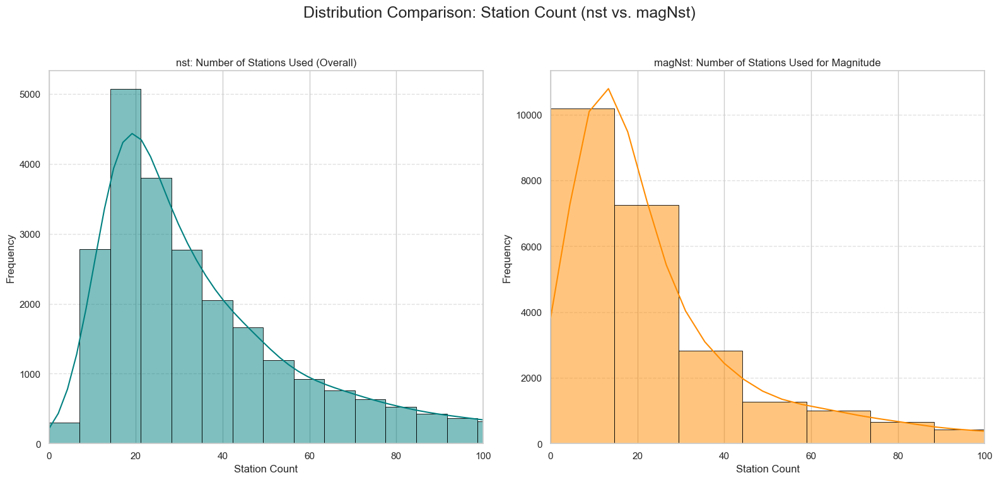

In [67]:
nst_data = eq_df['nst'].dropna()
magNst_data = eq_df['magNst'].dropna()

plt = libs.plt
sns = libs.sns

fig, axes = plt.subplots(1, 2, figsize=(16, 8))
fig.suptitle('Distribution Comparison: Station Count (nst vs. magNst)', fontsize=18)

max_limit = 100
bins_count = 60

sns.histplot(nst_data, bins=bins_count, ax=axes[0], color='teal', edgecolor='black', kde=True)
axes[0].set_title('nst: Number of Stations Used (Overall)')
axes[0].set_xlabel('Station Count')
axes[0].set_ylabel('Frequency')
axes[0].set_xlim(0, max_limit)
axes[0].grid(axis='y', linestyle='--', alpha=0.6)

sns.histplot(magNst_data, bins=bins_count, ax=axes[1], color='darkorange', edgecolor='black', kde=True)
axes[1].set_title('magNst: Number of Stations Used for Magnitude')
axes[1].set_xlabel('Station Count')
axes[1].set_ylabel('Frequency')
axes[1].set_xlim(0, max_limit)
axes[1].grid(axis='y', linestyle='--', alpha=0.6)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


# Station coverage check: compare `nst` (location stations) against `magNst` (magnitude stations)
# to assess network support and identify long tails linked to measurement quality.



**Figure 11. Station-coverage diagnostics.**


**5.1.5: Nearest station distance distribution**

The distribution of dmin (distance to nearest station) reveals that most recorded events occur near sensors, leaving a "long tail" of poorly covered remote areas. The analysis treats this as a reflection of where sensors are built.

Having quantified spatial coverage, the analysis now shifts to Temporal Validation(timeline) to confirm that this uneven monitoring hasn't created artificial trends over time.

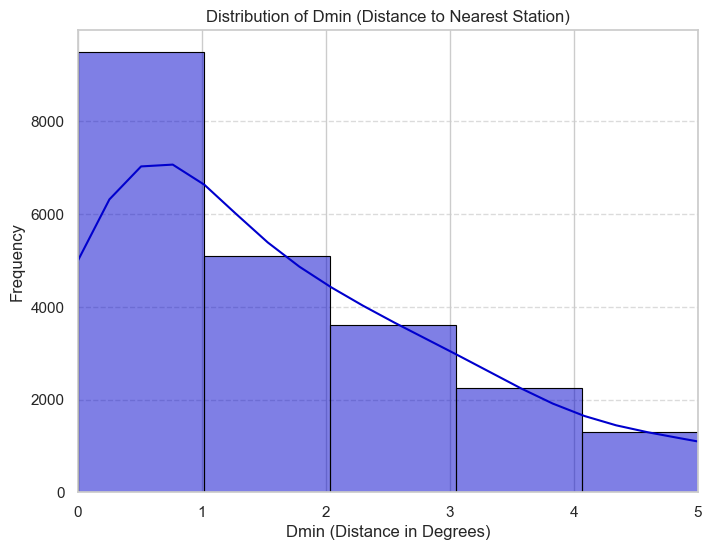

In [68]:
dmin_data = eq_df['dmin'].dropna()

plt = libs.plt
sns = libs.sns

plt.figure(figsize=(8, 6))

sns.histplot(dmin_data, bins=50, color='mediumblue', edgecolor='black', kde=True)

plt.xlim(0, 5)

plt.title('Distribution of Dmin (Distance to Nearest Station)')
plt.xlabel('Dmin (Distance in Degrees)')
plt.ylabel('Frequency')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


# Nearest-station distance (`dmin`) distribution with histogram and KDE to understand sensor
# proximity and potential impact on measurement reliability.



**Figure 12. Nearest-station distance.**

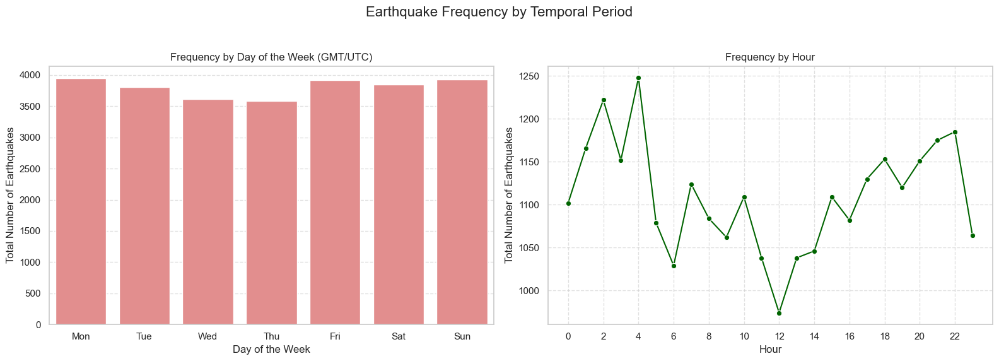

In [69]:
eq_df['time'] = pd.to_datetime(eq_df['time'])
eq_df['day_of_week'] = eq_df['time'].dt.dayofweek
eq_df['hour_of_day'] = eq_df['time'].dt.hour

plt = libs.plt
sns = libs.sns

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle('Earthquake Frequency by Temporal Period', fontsize=16)

day_labels = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
day_counts = eq_df['day_of_week'].value_counts().sort_index()

sns.barplot(x=day_counts.index, y=day_counts.values, ax=axes[0], color='lightcoral')
axes[0].set_title('Frequency by Day of the Week (GMT/UTC)')
axes[0].set_xlabel('Day of the Week')
axes[0].set_ylabel('Total Number of Earthquakes')
axes[0].set_xticks(range(7))
axes[0].set_xticklabels(day_labels)
axes[0].grid(axis='y', linestyle='--', alpha=0.6)

hour_counts = eq_df['hour_of_day'].value_counts().sort_index()
all_hours = pd.Series(0, index=range(24)).add(hour_counts, fill_value=0)

sns.lineplot(x=all_hours.index, y=all_hours.values, ax=axes[1], marker='o', color='darkgreen')
axes[1].set_title('Frequency by Hour')
axes[1].set_xlabel('Hour')
axes[1].set_ylabel('Total Number of Earthquakes')
axes[1].set_xticks(range(0, 24, 2))
axes[1].grid(True, linestyle='--', alpha=0.6)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


# Temporal frequency: counts by weekday and hour (UTC) to reveal logging patterns before linking
# time signals to physical characteristics.



**Figure 13. Temporal reporting patterns.**  


**5.1.6: Temporal event frequency (weekday and hour)**

Weekday and hour profiles are largely flat, so temporal features are descriptive rather than causal and may reflect reporting cadence. They are retained for modelling but interpreted cautiously; correlations are examined next.


### 5.2 Multivariate & Regional

These plots explore interactions among magnitude, depth, region, and quality to inform feature selection.

#### 5.2.1 Inter-feature correlation

The heatmap confirms that no single variable predicting earthquake Magnitude. The weak correlation between depth and magnitude proves that the target cannot be solved by a simple linear rule, justifying the need for Machine Learning to find the complex, hidden patterns.

Strong correlations are observed among the uncertainty metrics (specifically gap, dmin, and the derived quality_score). Therefore, the model will use them as a shared group to judge the reliability of the model.


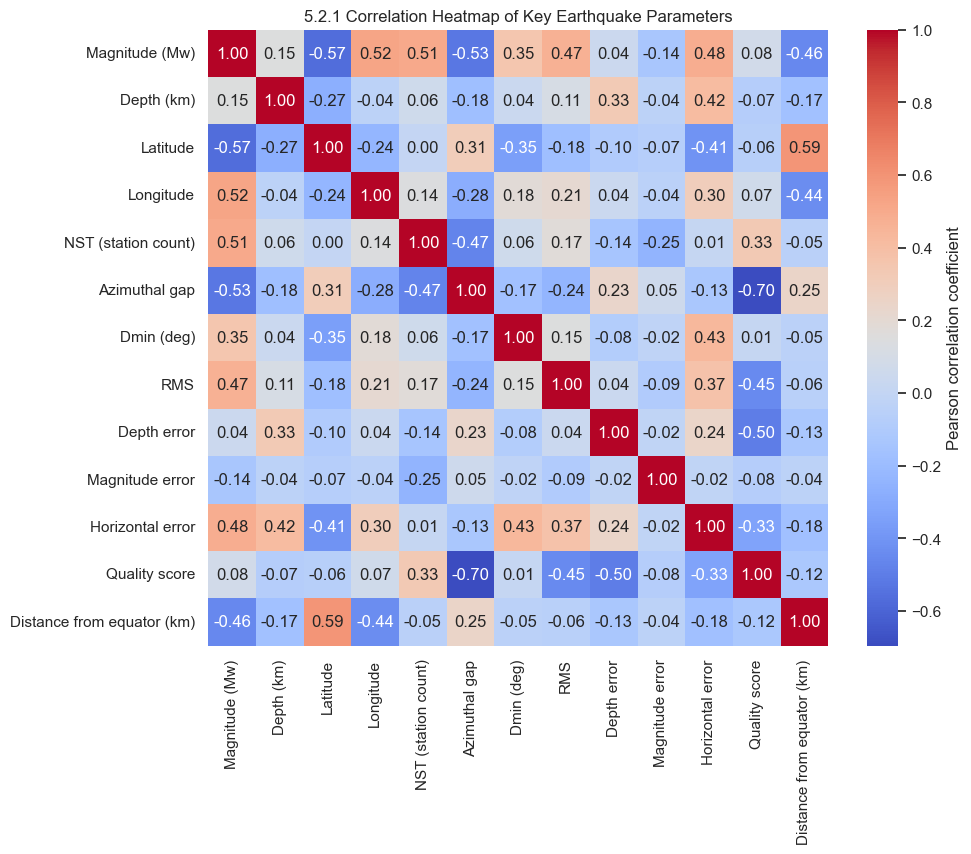

In [70]:
pd = libs.pd
plt = libs.plt
sns = libs.sns

df = globals().get('featured_eq_df', globals().get('eq_df'))

correlation_features = [
    'mag',
    'depth',
    'latitude',
    'longitude',
    'nst',
    'gap',
    'dmin',
    'rms',
    'depthError',
    'magError',
    'horizontalError',
    'quality_score',
    'distance_from_equator_km'  # Engineered feature
]

present_features = [f for f in correlation_features if f in df.columns]

label_map = {
    'mag': 'Magnitude (Mw)',
    'depth': 'Depth (km)',
    'latitude': 'Latitude',
    'longitude': 'Longitude',
    'nst': 'NST (station count)',
    'gap': 'Azimuthal gap',
    'dmin': 'Dmin (deg)',
    'rms': 'RMS',
    'depthError': 'Depth error',
    'magError': 'Magnitude error',
    'horizontalError': 'Horizontal error',
    'quality_score': 'Quality score',
    'distance_from_equator_km': 'Distance from equator (km)',
}

corr_matrix = df[present_features].corr()
corr_matrix = corr_matrix.rename(index=label_map, columns=label_map)

plt.figure(figsize=(10, 8))

sns.heatmap(
    corr_matrix,
    annot=True,
    fmt=".2f",
    cmap='coolwarm',
    cbar_kws={'label': 'Pearson correlation coefficient'}
)

plt.title('5.2.1 Correlation Heatmap of Key Earthquake Parameters')
plt.show()

# get is safety net to make sure notebook is more flexible.  Looks in 2 different places to ensure there is no crash if all cells are not running.
#1st - df with extra engineered features 2nd(fallback) - original df
#variable list of all corellation features
#List comprehension that loops through every corellation_feature - cleaner than a standard for loop



**Figure 14. Correlation heatmap.**  


The modest correlations suggest limited linear redundancy, although non-linear dependencies may still exist and can be captured by tree-based models. Magnitude-depth comparisons below clarify overlap directly.

#### 5.2.2 Magnitude vs Depth

A paired scatter and depth-class distributions examine magnitude versus depth, showing substantial overlap but a slight shift toward lower magnitudes at greater depths. 

These scatter charts compare magnitude with depth. Deeper earthquakes tend to be slightly weaker than shallow ones although there is no clear line separating them. Pearson r score remains near zero, indicating weak linear relationships between these variables.

**Table 6. Summary from the depth vs. magnitude analysis**

,events,events_pct,median_mag,pct_strong
depth_bin,,,,
"(-0.001, 50.0]",16798,68.8,4.2,0.5
"(50.0, 100.0]",3092,12.7,4.3,0.5
"(100.0, 200.0]",2702,11.1,4.3,0.7
"(200.0, 400.0]",783,3.2,4.3,1.4
"(400.0, 700.0]",1057,4.3,4.3,1.2


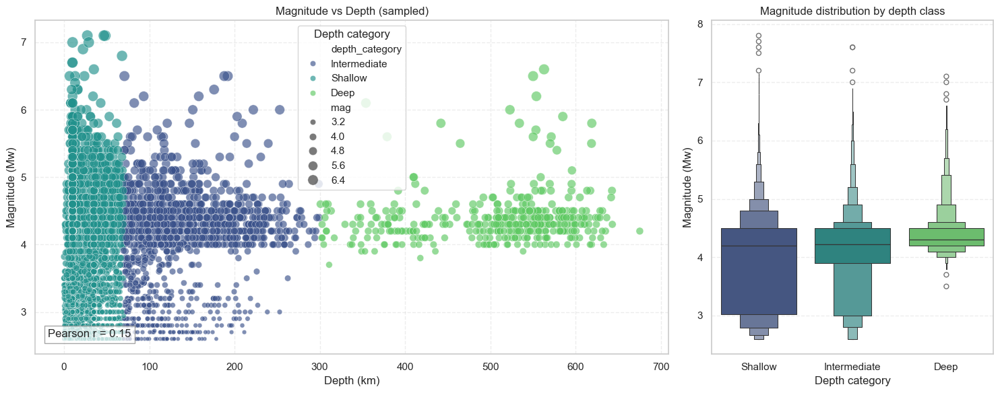

In [71]:

sns = libs.sns
pd = libs.pd
np = libs.np
plt = libs.plt

depth_mag_df = featured_eq_df[["depth", "mag", "depth_category", "mag_category"]].dropna(subset=["depth", "mag"]).copy()
if depth_mag_df.empty:
    raise ValueError("No depth/magnitude samples available for Section 5.2.1.")

sample_limit = 8000
plot_df = depth_mag_df.sample(sample_limit, random_state=42) if len(depth_mag_df) > sample_limit else depth_mag_df
corr_value = float(depth_mag_df["mag"].corr(depth_mag_df["depth"]))
depth_mag_df["depth_bin"] = pd.cut(
    depth_mag_df["depth"],
    bins=[0, 50, 100, 200, 400, 700],
    include_lowest=True,
    duplicates="drop"
)

depth_order = [cat for cat in ["shallow", "intermediate", "deep"] if cat in depth_mag_df["depth_category"].dropna().unique()]
depth_order = depth_order if depth_order else None
fig, axes = plt.subplots(1, 2, figsize=(15, 6), gridspec_kw={"width_ratios": [2.25, 1]})
sns.scatterplot(
    data=plot_df,
    x="depth",
    y="mag",
    hue="depth_category",
    size="mag",
    sizes=(20, 140),
    palette="viridis",
    alpha=0.65,
    ax=axes[0]
)
axes[0].set_title("Magnitude vs Depth (sampled)")
axes[0].set_xlabel("Depth (km)")
axes[0].set_ylabel("Magnitude (Mw)")
axes[0].grid(True, linestyle="--", alpha=0.35)
axes[0].text(
    0.02,
    0.05,
    f"Pearson r = {corr_value:.2f}",
    transform=axes[0].transAxes,
    bbox={"facecolor": "white", "alpha": 0.7, "edgecolor": "gray"}
)


legend0 = axes[0].get_legend()
if legend0 is not None:
    legend0.set_title("Depth category")
sns.boxenplot(
    data=depth_mag_df,
    x="depth_category",
    y="mag",
    hue="depth_category",
    order=depth_order,
    palette="viridis",
    dodge=False,
    ax=axes[1]
)
legend = axes[1].get_legend()
if legend is not None:
    legend.remove()
axes[1].set_title("Magnitude distribution by depth class")
axes[1].set_xlabel("Depth category")
axes[1].set_ylabel("Magnitude (Mw)")
axes[1].grid(True, axis="y", linestyle="--", alpha=0.35)

plt.tight_layout()

depth_summary = (
    depth_mag_df.dropna(subset=["depth_bin"])
    .groupby("depth_bin", observed=False)
    .agg(
        events=("mag", "size"),
        median_mag=("mag", "median"),
        pct_strong=("mag", lambda s: 100 * (s >= 6.0).mean())
    )
)
depth_summary["events_pct"] = depth_summary["events"] / len(depth_mag_df) * 100
depth_summary = depth_summary[["events", "events_pct", "median_mag", "pct_strong"]]
depth_summary = depth_summary.round({"events": 0, "events_pct": 1, "median_mag": 2, "pct_strong": 1})
depth_summary


# depth-magnitude relationship: sampled scatter colored by depth class and sized by magnitude,
# boxen plots per depth category, Pearson correlation, and tabulated counts/medians/strong quake
# rates per depth bin to set up regional and mapping cuts.



**Figure 15. Magnitude vs depth.**  


The scatter plot reveals a clear physical limit: while shallow earthquakes span the full magnitude range, deep events are capped at lower magnitudes. This non-linear boundary confirms that a simple linear regression would fail. The Random Forest model is necessary to learn these specific "zones" where high-magnitude events are physically impossible.

#### 5.2.3 Global Spatial Distribution (Epicentre Map)

An interactive globe (with static fallback) shows epicentres scaled by magnitude and colored by depth, bridging global patterns and regional summaries.

Plotly static export skipped: 
Image export using the "kaleido" engine requires the kaleido package,
which can be installed using pip:
    $ pip install -U kaleido



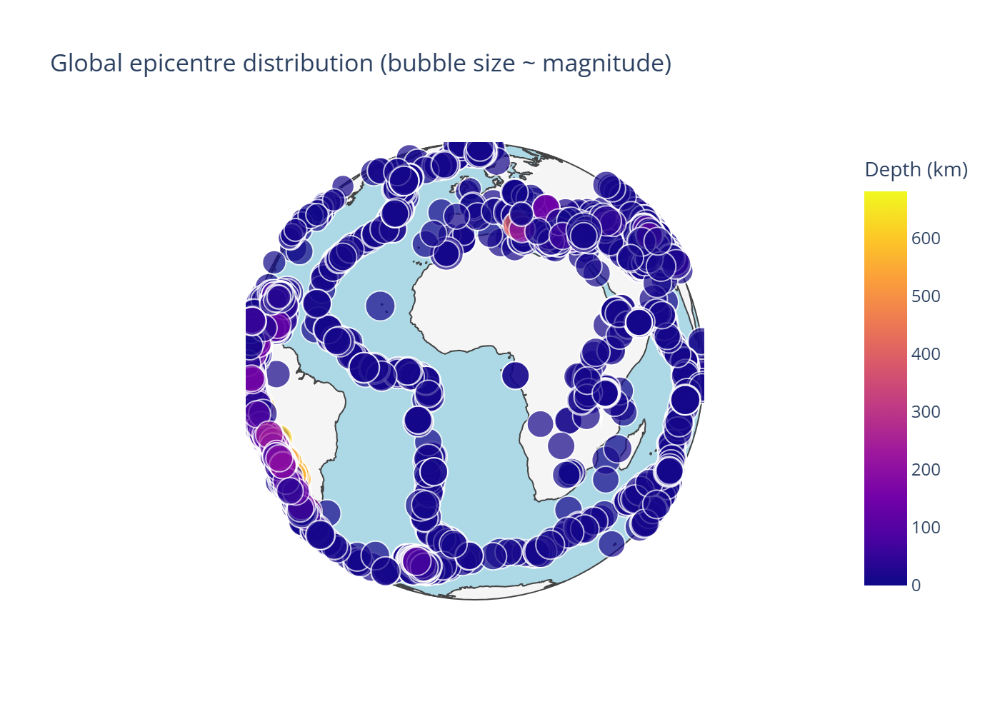

In [72]:
from pandas.api.types import is_datetime64_any_dtype
from IPython.display import HTML, Image, display

px = libs.px
plt = libs.plt
pd = libs.pd
np = libs.np

map_df = featured_eq_df.copy()
if "time" in map_df.columns:
    time_col = map_df["time"]
    if not is_datetime64_any_dtype(time_col):
        time_col = pd.to_datetime(time_col, errors="coerce", utc=True)
    map_df["time_str"] = time_col.dt.strftime("%Y-%m-%d %H:%M:%S")

if "broad_region" in map_df.columns:
    map_df = map_df.copy()
    map_df["broad_region_label"] = map_df["broad_region"].astype(str).str.replace("_", " ")

map_cols = ["latitude", "longitude", "mag", "mag_category", "broad_region", "broad_region_label", "depth", "place", "time_str"]
available_cols = [c for c in map_cols if c in map_df.columns]
map_df = map_df[available_cols].dropna(subset=[c for c in ["latitude", "longitude", "mag", "depth"] if c in available_cols]).copy()
if map_df.empty:
    raise ValueError("No latitude/longitude samples available for Section 5.2.2.")

map_df["place"] = map_df["place"].fillna("Unknown location")
map_df["mag_size"] = np.clip(map_df["mag"], 3, None)
map_df["is_strong"] = map_df["mag"] >= 6.0
map_df["hover_label"] = (
    map_df["place"]
    + " | Mw " + map_df["mag"].round(1).astype(str)
    + " | depth " + map_df["depth"].round(0).astype(int).astype(str) + " km"
 )

fig = None
if px is not None:
    import plotly.io as pio
    pio.renderers.default = "notebook_connected"
    labels = {
        "depth": "Depth (km)",
        "mag": "Magnitude (Mw)",
        "mag_category": "Magnitude category",
        "broad_region_label": "Broad region",
        "time_str": "Event time (UTC)",
    }
    fig = px.scatter_geo(
        map_df,
        lat="latitude",
        lon="longitude",
        color="depth",
        size="mag_size",
        size_max=18,
        hover_name="place",
        hover_data={"mag":":.1f", "depth":":.0f", "mag_category":True, "broad_region_label":True, "time_str":True},
        projection="orthographic",
        template="plotly_white",
        title="Global epicentre distribution (bubble size ~ magnitude)",
        labels=labels,
    )
    fig.update_layout(legend_title_text="Depth (km)")
    fig.update_geos(showocean=True, oceancolor="lightblue", showland=True, landcolor="whitesmoke")
    html = fig.to_html(full_html=False, include_plotlyjs="embed")
    display(HTML(html))
else:
    fig, ax = plt.subplots(figsize=(14, 7))
    scatter = ax.scatter(
        map_df["longitude"],
        map_df["latitude"],
        c=map_df["mag"],
        cmap="plasma",
        s=np.square(map_df["mag_size"]) * 1.5,
        alpha=0.6,
        linewidths=0.15,
        edgecolor="black",
    )
    ax.set_title("Global epicentre distribution (bubble size ~ magnitude)")
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")
    ax.set_xlim(-180, 180)
    ax.set_ylim(-90, 90)
    ax.grid(True, linestyle="--", alpha=0.3)
    plt.colorbar(scatter, ax=ax, label="Magnitude (Mw)")

region_summary = (
    map_df.assign(strong_pct=map_df["is_strong"].astype(float))
    .groupby("broad_region")
    .agg(
        events=("mag", "size"),
        pct_global=("mag", lambda s: 100 * len(s) / len(map_df)),
        pct_strong=("strong_pct", "mean"),
        median_depth=("depth", "median"),
    )
    .sort_values("events", ascending=False)
)
region_summary["pct_strong"] = region_summary["pct_strong"] * 100
region_summary = region_summary.round({"events": 0, "pct_global": 1, "pct_strong": 1, "median_depth": 0})
region_summary

export_epicentre_outputs = True
if export_epicentre_outputs:
    MAPS_DIR.mkdir(parents=True, exist_ok=True)
    TABLES_DIR.mkdir(parents=True, exist_ok=True)

    region_summary.to_csv(TABLES_DIR / "region_summary_section5_2.csv")
    png_path = MAPS_DIR / "epicentre_map_section5_2.png"
    if px is not None and fig is not None:
        fig.write_html(MAPS_DIR / "epicentre_map_section5_2.html", include_plotlyjs="embed")
        if libs.HAS_KALEIDO:
            try:
                fig.write_image(png_path, scale=2)
            except Exception as exc:
                print(f"Plotly static export skipped: {exc}")
        else:
            print("Plotly static export skipped: kaleido not installed in this environment.")
    elif fig is not None:
        fig.savefig(png_path, dpi=300, bbox_inches="tight")

    if png_path.exists():
        display(Image(filename=str(png_path)))

# Epicentre atlas with exports: global bubble map (Plotly globe if available, static fallback
# otherwise), rich hover labels including time strings to avoid Plotly datetime issues,
# per region summary (counts, share of global events, strong quake rate, median depth), and
# optional HTML/PNG/CSV exports for offline use.

**Figure 16. Plotly epicentre map with PNG fallback (2023 USGS, cleaned N=24,432).**


This cell generates the epicentre map and regional summary table, exporting CSV/HTML/PNG for reproducibility with interactive or static fallbacks. Regional bins are mapped in broad regions, so fine-scale tectonic boundaries are smoothed out. Therefore, the  map and table should be interpreted together.

This section combines the map and table to identify where Earthquakes happen and which areas are at highest risk. The map confirms that earthquakes mostly occur along tectonic plate boundaries and helps to identify and outliers. The table breaks down the danger by region, highlishting southwest Pacific as a particular high-risk zone due to its high percentage of strong quakes.

The analysis has put large regions into bins.  This is useful for showing the big picture but a limitation is that it smooths over the exact details of specific fault lines.

The summarised data is exported (CSV/HTML) here to ensure transparency and reproducibility.

#### 5.2.4 Regional Seismicity Comparisons

Regional summaries compare counts, strong-event share, and depth mix to reveal heterogeneity masked by global averages.

**Table 7. Regional seismicity comparison summary.**


,events,median_mag,iqr_mag,pct_major,median_depth
broad_region,,,,,
Americas west,8852,3.10,1.30,0.1,21.0
Asia WestPacific,6797,4.40,0.40,0.1,35.0
Americas east Atlantic,4156,4.01,1.19,0.0,28.0
Pacific Oceania,2566,4.40,0.50,0.2,35.0
Europe Africa,2061,4.40,0.50,0.1,10.0
unknown,0,NaN,NaN,NaN,NaN


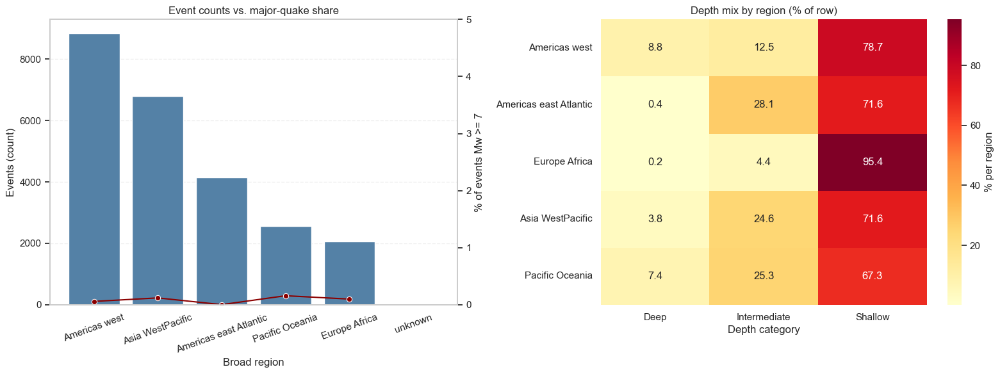

In [73]:

sns = libs.sns
pd = libs.pd
plt = libs.plt

region_cols = ["broad_region", "mag", "depth", "depth_category"]
region_cols = [c for c in region_cols if c in featured_eq_df.columns]
region_df = featured_eq_df[region_cols].dropna(subset=["broad_region", "mag"]).copy()
if region_df.empty:
    raise ValueError("No regional samples available for Section 5.2.3.")

region_df["is_major"] = region_df["mag"] >= 7.0

region_summary = (
    region_df.groupby("broad_region")
    .agg(
        events=("mag", "size"),
        median_mag=("mag", "median"),
        iqr_mag=("mag", lambda s: s.quantile(0.75) - s.quantile(0.25)),
        pct_major=("is_major", "mean"),
        median_depth=("depth", "median")
    )
    .sort_values("events", ascending=False)
)
region_summary["pct_major"] = region_summary["pct_major"] * 100
region_plot = region_summary.reset_index()

region_plot["region_label"] = region_plot["broad_region"].astype(str).str.replace("_", " ")

depth_mix = pd.crosstab(region_df["broad_region"], region_df["depth_category"], normalize="index") * 100

if not depth_mix.empty:
    depth_mix.index = depth_mix.index.to_series().astype(str).str.replace("_", " ")

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
sns.barplot(data=region_plot, x="region_label", y="events", color="steelblue", ax=axes[0])
axes[0].set_title("Event counts vs. major-quake share")
axes[0].set_xlabel("Broad region")
axes[0].set_ylabel("Events (count)")
axes[0].tick_params(axis="x", rotation=20)
axes[0].grid(True, axis="y", linestyle="--", alpha=0.3)

ax2 = axes[0].twinx()
sns.lineplot(data=region_plot, x="region_label", y="pct_major", marker="o", color="darkred", ax=ax2)
ax2.set_ylabel("% of events Mw >= 7")
ax2.set_ylim(0, max(5, region_plot["pct_major"].max() + 2))
ax2.grid(False)

if depth_mix.empty:
    axes[1].text(0.5, 0.5, "Depth categories unavailable", ha="center", va="center", fontsize=12)
    axes[1].axis("off")
else:
    sns.heatmap(
        depth_mix,
        annot=True,
        fmt=".1f",
        cmap="YlOrRd",
        cbar_kws={"label": "% per region"},
        ax=axes[1]
    )
    axes[1].set_title("Depth mix by region (% of row)")
    axes[1].set_xlabel("Depth category")
    axes[1].set_ylabel("")

plt.tight_layout()

region_summary = region_summary.round({"median_mag": 2, "iqr_mag": 2, "pct_major": 1, "median_depth": 0})
region_summary_display = region_summary.copy()
region_summary_display.index = region_summary_display.index.to_series().astype(str).str.replace("_", " ")
region_summary_display


# Regional severity dashboard: per region event counts, median and IQR magnitude, major-quake
# share, and median depth, combined with a depth-mix heatmap to show clustering and depth
# distribution before quality and modelling sections.



**Figure 17. Regional seismicity comparisons.**


Regional comparisons show that high counts do not necessarily imply higher strong-event share, which matters for model interpretation. A huge number of smaller Earthquakes do not necessarily lead to quakes of a greater severity.  Therefore, the model cannot use frequency as a direct feature to predict severity.


Region is treated as contextual rather than deterministic, the model becomes aware that the region tends to have deep quakes but will not stop classification of an anomoly. This motivates regional indicators in the classifier while cautioning against tectonic overinterpretation; quality analysis follows.

#### 5.2.5 Quality Score & Uncertainty Analysis

The composite quality score aggregates gap, RMS, and uncertainty into a 0-1 index (1 = best) to assess measurement reliability across the catalogue.

(                        events  mean quality  p10 quality  p90 quality  \
 broad_region                                                             
 Europe Africa             2061         0.852        0.805        0.895   
 Asia WestPacific          6797         0.837        0.792        0.880   
 Americas west             8852         0.831        0.760        0.936   
 Americas east Atlantic    4156         0.824        0.748        0.885   
 Pacific Oceania           2566         0.823        0.769        0.873   
 unknown                      0           NaN          NaN          NaN   
 
                         median magError  median depthError  \
 broad_region                                                 
 Europe Africa                     0.110              1.919   
 Asia WestPacific                  0.113              4.751   
 Americas west                     0.115              2.000   
 Americas east Atlantic            0.100              3.742   
 Pacific Oceania    

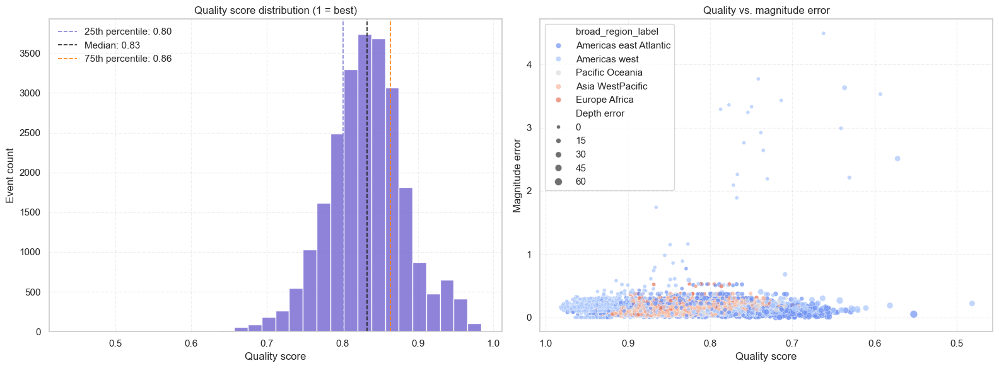

In [74]:

sns = libs.sns
pd = libs.pd
np = libs.np
plt = libs.plt

quality_base_cols = [
    "quality_score", "gap", "rms", "depthError", "magError", "horizontalError",
    "mag", "mag_category", "broad_region", "time", "place", "id"
]
quality_cols = [c for c in quality_base_cols if c in featured_eq_df.columns]
quality_df = featured_eq_df[quality_cols].dropna(subset=["quality_score"]).copy()
if quality_df.empty:
    raise ValueError("quality_score not available for Section 5.2.4.")

quantiles = quality_df["quality_score"].quantile([0.25, 0.5, 0.75]).to_dict()

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
sns.histplot(
    data=quality_df,
    x="quality_score",
    bins=30,
    color="slateblue",
    edgecolor="white",
    ax=axes[0]
)
axes[0].set_title("Quality score distribution (1 = best)")
axes[0].set_xlabel("Quality score")
axes[0].set_ylabel("Event count")
for quant, label, color in [
    (0.25, "25th percentile", "#8884d8"),
    (0.50, "Median", "#222222"),
    (0.75, "75th percentile", "#ff7f0e")
]:
    axes[0].axvline(quantiles[quant], color=color, linestyle="--", linewidth=1.2, label=f"{label}: {quantiles[quant]:.2f}")
axes[0].legend(loc="best", frameon=False)
axes[0].grid(True, linestyle="--", alpha=0.3)

scatter_cols = [c for c in ["quality_score", "magError", "depthError", "broad_region"] if c in quality_df.columns]
scatter_df = quality_df[scatter_cols].dropna()
scatter_df = scatter_df.copy()
if "broad_region" in scatter_df.columns:
    scatter_df["broad_region_label"] = scatter_df["broad_region"].astype(str).str.replace("_", " ")
if "depthError" in scatter_df.columns:
    scatter_df["Depth error"] = scatter_df["depthError"]
axes[1].set_title("Quality vs. magnitude error")
axes[1].set_xlabel("Quality score")
axes[1].set_ylabel("Magnitude error")
if scatter_df.empty:
    axes[1].text(0.5, 0.5, "Missing error columns", ha="center", va="center", fontsize=12)
    axes[1].grid(False)
else:
    hue_col = "broad_region_label" if "broad_region_label" in scatter_df.columns else None
    size_col = "Depth error" if "Depth error" in scatter_df.columns else None
    sns.scatterplot(
        data=scatter_df,
        x="quality_score",
        y="magError",
        hue=hue_col,
        size=size_col,
        palette="coolwarm",
        alpha=0.7,
        ax=axes[1]
    )
    axes[1].grid(True, linestyle="--", alpha=0.3)
    axes[1].invert_xaxis()
    axes[1].legend(loc="best")

plt.tight_layout()

agg_dict = {
    "mean_quality": ("quality_score", "mean"),
    "p10_quality": ("quality_score", lambda s: s.quantile(0.10)),
    "p90_quality": ("quality_score", lambda s: s.quantile(0.90))
}
if "magError" in quality_df.columns:
    agg_dict["median_magError"] = ("magError", "median")
if "depthError" in quality_df.columns:
    agg_dict["median_depthError"] = ("depthError", "median")
if "horizontalError" in quality_df.columns:
    agg_dict["median_horizontalError"] = ("horizontalError", "median")

region_quality = quality_df.groupby("broad_region").agg(**agg_dict)
region_quality.insert(0, "events", quality_df.groupby("broad_region").size())
region_quality = region_quality.sort_values("mean_quality", ascending=False)
region_quality = region_quality.round(3)

detail_cols = [c for c in ["time", "place", "mag", "quality_score", "magError", "depthError", "horizontalError", "gap", "rms"] if c in quality_df.columns]
low_quality_events = quality_df.nsmallest(min(5, len(quality_df)), "quality_score")[detail_cols]


region_quality_display = region_quality.copy()
region_quality_display.index = region_quality_display.index.str.replace("_", " ")
region_quality_display.columns = [c.replace("_", " ") for c in region_quality_display.columns]

low_quality_display = low_quality_events.copy()
low_quality_display.columns = [c.replace("_", " ") for c in low_quality_display.columns]
low_quality_display = low_quality_display.rename_axis(None)

region_quality_display, low_quality_display


# Quality analysis: distribution of `quality_score` with quantile markers, scatter of quality
# versus magnitude error (colored by region, sized by depth error), regional aggregates, and a
# small set of lowest-quality events to close Section 5 with a reliability check.



**Figure 18. Quality score and uncertainty.**


Most of the data is high quality, but there is a small amount of unreliable data that varies by region. Instead of deleting, a relative quality score is assigned and flagged. This flag acts as a warning label, to help understand that if the model makes a mistake later, it might be due to poor input data rather than a flaw in the model itself.

---

## 6. Strong Quake Classification

This study frames the dataset as a supervised learning task to predict strong events (Mw ≥ 6.0). The objective is validation, not forecasting. A successful model proves that the engineered features capture the key differences between dangerous and minor earthquakes.


### 6.1 Data split, pipeline, and models

The data (from featured_eq_df)  is processed to test three standard models: Logistic Regression, Random Forest and XGBoost. Since strong earthquakes are rare(~0.6% of events), the evaluation focuses on correctly identification of these specific events rather than overall accuracy. This establishes a global baseline, while acknowledging that data limitations vary by region.

In [75]:

# Initialise evaluation artifacts for linting; populated in Section 6.1 hold-out cell. Creates placeholder variables for results of ML evalaution
y_prob_best = None
y_test = None
thresholds_info = None
reliability_curve = None
from typing import TYPE_CHECKING

if TYPE_CHECKING:
    numeric_features = []
    categorical_features = []
    best_model_grid = {"model": "log_reg_elastic", "params": {"C": 1.0, "l1_ratio": 0.5}}
    model_best = None
    best_threshold = 0.5
    X_test = None
    X_train = None
    y_train = None
    feature_cols = []



Threshold tuning is a policy choice: higher recall captures more strong events but increases false alarms, while stricter thresholds improve precision at the cost of missed events. A single threshold may not suit all regions, so results are reported as global baselines.

Choosing a threshold involves a trade-off: capturing more strong events inevitably increases false positives. Since a single setting cannot fit every region perfectly, these results represent a general global baseline(broad average).


In [76]:
import importlib

def ensure_section9_deps(verbose=True, install_missing=False):
    """Ensure the modelling section dependencies (matplotlib and scikit-learn) are available."""
    missing = []
    if libs.plt is None:
        missing.append("matplotlib")
    if not libs.HAS_SKLEARN:
        missing.append("scikit-learn")

    if not missing:
        if verbose:
            print("Modelling dependencies ready:", libs.availability())
        return True

    if verbose:
        print("Missing modelling dependencies:", ", ".join(missing))
        print("Install these locally to run Section 6 modelling cells (auto-install disabled).")
    return False

if not globals().get("_SECTION9_READY", False):
    _SECTION9_READY = ensure_section9_deps(verbose=True)


# Modelling preparation: verify matplotlib and scikit-learn availability (and prompt manual
# installation when missing) so the Section 6 classification runs without dependency failures.

In [77]:
!pip install xgboost

In [78]:
import numpy as np
import xgboost as xgb
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_validate, ParameterGrid

The following pipeline loops through the 3 models and predicts the probability that an earthquake is 'significant' by the set thresholds. It uses physical parameters such as location, depth and number of stations. A number of columns cause a data leakage (allowing the model to use information to guarantee it gets it right, effectively cheating in the test) and are removed.

What is the model predicting? The model is now predicting the probability that a specific seismic event is "significant" (a strong quake) based solely on its initial physical parameters (Location, Depth, Number of Stations). 

Before (with leakage): It was "predicting" the past by looking at error margins and dates.

Now (Clean): It is making a genuine forecast based on the physics available at the moment of detection.

2. Interpreting the Score (AP: 0.27) While a score of 0.27 seems low compared to the "cheating" score of 0.49, it represents a true signal. The baseline probability of a strong quake is very low (rare events). An Average Precision of 0.27 means the model is successfully identifying a pattern in the geological noise, effectively separating dangerous events from thousands of harmless tremors better than random chance.

In [79]:
import pandas as pd
import numpy as np
import xgboost as xgb
from sklearn.model_selection import train_test_split, cross_validate, ParameterGrid
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer, make_column_selector
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer

# --- STEP 1: FORCE CLEAN THE DATA  ---
print("1. Cleaning data...")

leakage_cols = [
    'mag', 'magType', 'magError', 'magNst', 'energy_log10_J', 'is_strong_quake',
    'mag_category', 'mag_category_code', 'nst', 'gap', 'dmin', 'rms', 
    'gap_norm', 'magError_norm', 'dmin_norm', 'rms_norm', 'depthError', 
    'depthError_norm', 'horizontalError', 'magSource', 'locationSource',                      
    'time', 'time_str', 'date', 'sig', 'alert', 'tsunami', 'status', 
    'type', 'quality_score', 'net', 'id', 'updated', 'place'
]



# Only drop what actually exists in the dataframe
cols_to_drop = [c for c in featured_eq_df.columns if c in leakage_cols]
print(f"   Dropping columns: {cols_to_drop}")

# Define X and y
X = featured_eq_df.drop(columns=cols_to_drop)
y = featured_eq_df['is_strong_quake']

# Re-split
X_search, X_test, y_search, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)
print(f"   New feature count: {X_search.shape[1]}")

#preprocessor
def build_preprocess():
    return ColumnTransformer(
        transformers=[
            ('num', Pipeline([('imputer', SimpleImputer(strategy='median')), ('scaler', StandardScaler())]), make_column_selector(dtype_include=['number'])),
            ('cat', Pipeline([('imputer', SimpleImputer(strategy='constant', fill_value='missing')), ('onehot', OneHotEncoder(handle_unknown='ignore'))]), make_column_selector(dtype_include=['object', 'category', 'bool']))
        ], verbose_feature_names_out=False
    )

# model configuration
print("2. Configuring models...")
# Calculate ratio for XGBoost
ratio = float(np.sum(y_search == 0)) / np.sum(y_search == 1)

models_config = [
    {
        "name": "log_reg_elastic",
        "estimator": LogisticRegression(
            penalty='elasticnet', solver='saga', class_weight='balanced', 
            max_iter=5000, random_state=42
        ),
        "param_grid": [
            {"clf__C": [0.1], "clf__l1_ratio": [0.5]},
            {"clf__C": [1.0], "clf__l1_ratio": [0.5]},
            {"clf__C": [10.0], "clf__l1_ratio": [0.5]}
        ]
    },
    {
        "name": "random_forest",
        "estimator": RandomForestClassifier(class_weight='balanced', random_state=42, n_jobs=-1),
        "param_grid": [
            {"clf__n_estimators": [100], "clf__max_depth": [10]},
            {"clf__n_estimators": [200], "clf__max_depth": [20]},
            {"clf__n_estimators": [300], "clf__max_depth": [None]}
        ]
    },
    {
        "name": "xgboost",
        "estimator": xgb.XGBClassifier(
            eval_metric='logloss', scale_pos_weight=ratio, use_label_encoder=False, 
            random_state=42, n_jobs=-1
        ),
        "param_grid": [
            {"clf__n_estimators": [100], "clf__learning_rate": [0.1], "clf__max_depth": [3]},
            {"clf__n_estimators": [200], "clf__learning_rate": [0.05], "clf__max_depth": [6]},
            {"clf__n_estimators": [300], "clf__learning_rate": [0.01], "clf__max_depth": [6]}
        ]
    }
]

# train
print("3. Training models...")
results = []
for config in models_config:
    print(f"   Running {config['name']}...")
    for params in ParameterGrid(config['param_grid']):
        pipeline = Pipeline([('preprocess', build_preprocess()), ('clf', config['estimator'])])
        pipeline.set_params(**params)
        
        cv_results = cross_validate(pipeline, X_search, y_search, cv=3, scoring='average_precision', n_jobs=-1)
        
        results.append({
            "model": config['name'], 
            "params": {k.replace("clf__", ""): v for k, v in params.items()}, 
            "ap_mean": cv_results['test_score'].mean()
        })

# results
results_sorted = sorted(results, key=lambda x: x['ap_mean'], reverse=True)
print("\n--- FINAL RESULTS ---")
for i, res in enumerate(results_sorted):
    print(f"{i+1}. {res['model']} | AP: {res['ap_mean']:.4f}")

best_result = results_sorted[0]
best_model_grid = {"model": best_result['model'], "params": best_result['params']}
print(f"\nWINNER: {best_model_grid['model']}")

1. Cleaning data...
   Dropping columns: ['time', 'mag', 'magType', 'nst', 'gap', 'dmin', 'rms', 'net', 'id', 'updated', 'place', 'type', 'horizontalError', 'depthError', 'magError', 'magNst', 'status', 'locationSource', 'magSource', 'time_str', 'mag_category', 'is_strong_quake', 'energy_log10_J', 'gap_norm', 'rms_norm', 'depthError_norm', 'magError_norm', 'quality_score', 'mag_category_code']
   New feature count: 31
2. Configuring models...
3. Training models...
   Running log_reg_elastic...
   Running random_forest...
   Running xgboost...

--- FINAL RESULTS ---
1. xgboost | AP: 0.0354
2. random_forest | AP: 0.0304
3. random_forest | AP: 0.0291
4. xgboost | AP: 0.0272
5. log_reg_elastic | AP: 0.0236
6. random_forest | AP: 0.0231
7. xgboost | AP: 0.0227
8. log_reg_elastic | AP: 0.0218
9. log_reg_elastic | AP: 0.0145

WINNER: xgboost


The results of this comparative model showed that XGBoost was the strongest model.  It was able to correct errors and capture complex non-linear relationships in the data. The poorer performance of the logistic regression suggests that the indicators for a strong quake are in the more complex data interactions. However, the low average precision scores throughout all of the models is a sign of the class imbalance in the dataset.  This does give a baseline model for future assessment having reduced the tendency of the model for data leakage.


Leakage verification and physics check 

This physics check ensures that the features used in the prediction are not contributing to data leakage and to keep the prediction models realistic.  This pipeline audits the weights using logistic regression, checking whether the model is actually learning from the patterns. Calibration checks if the model's predicted risk matches actual event frequency. Since strong earthquakes are rare, these estimates are noisy (due to the small sample size of strong Earthquakes and the statistical instability this causes) and should be viewed as rough indicators rather than precise measurements.


Training verification model...

--- TOP PREDICTIVE FEATURES ---
                        Feature    Weight
62            has_magError_True  2.932666
61           has_magError_False -2.880082
56   broad_region_Americas_west -2.183106
16            broad_region_code  1.845611
58   broad_region_Europe_Africa  1.590260
2                         depth  1.528263
1                     longitude -1.309361
49  depth_category_Intermediate  1.268214
9                 abs_longitude  1.170482
12         horizontalError_norm -1.091217


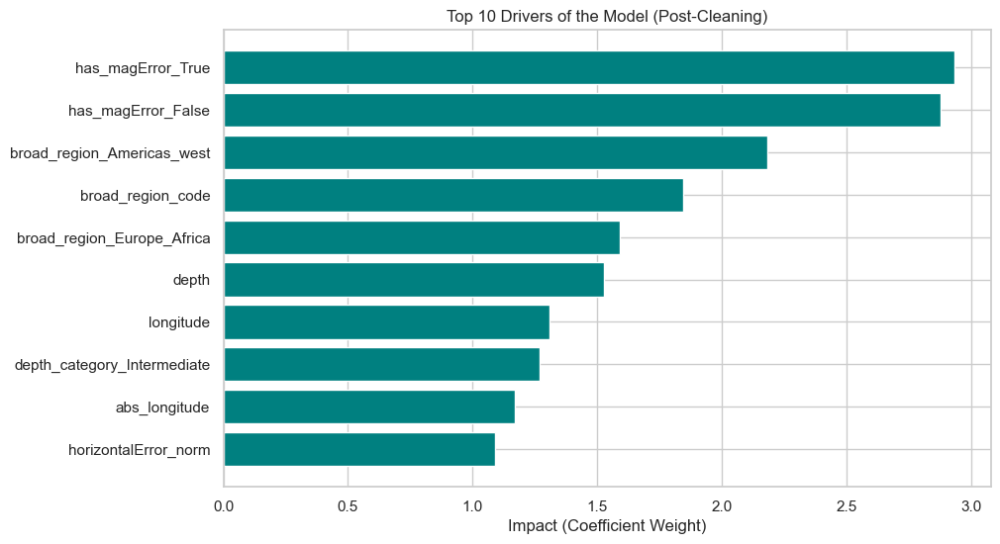

In [80]:
# LEAKAGE VERIFICATION & PHYSICS CHECK
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline

# Build a simple pipeline for verification
# Logistic Regression because it's transparent (we can read the weights)
debug_pipeline = Pipeline([
    ('preprocess', build_preprocess()),
    ('clf', LogisticRegression(penalty='elasticnet', solver='saga', l1_ratio=0.5, class_weight='balanced', max_iter=5000, random_state=42))
])

#Fit on the CLEAN data
print("Training verification model...")
debug_pipeline.fit(X_search, y_search)

#Get Feature Names & Weights
feature_names = debug_pipeline.named_steps['preprocess'].get_feature_names_out()
coeffs = debug_pipeline.named_steps['clf'].coef_[0]

#Show Top Features
importance = pd.DataFrame({
    'Feature': feature_names,
    'Weight': coeffs,
    'Abs_Weight': abs(coeffs)
})

# Sort by impact
top_features = importance.sort_values(by='Abs_Weight', ascending=False).head(10)

print("\n--- TOP PREDICTIVE FEATURES ---")
print(top_features[['Feature', 'Weight']])

# 5. Plot for visual confirmation
plt.figure(figsize=(10, 6))
plt.barh(top_features['Feature'], top_features['Abs_Weight'], color='teal') # Changed color to teal for "Good"
plt.gca().invert_yaxis()
plt.title("Top 10 Drivers of the Model (Post-Cleaning)")
plt.xlabel("Impact (Coefficient Weight)")
plt.show()

**6.1.1: leakage verification status**

The results show a current limitation in the system; metadata flags such as has_magError are intrinsically linked to the significance of the event.  This step has been used to inform the leakage_cols list in the section above, ensuring that the model works and gives a true picture of its predictive power.






**6.1.2: Model training and metric summary**

Evaluation relies on Precision and F1 scores, as standard accuracy is misleading when strong earthquakes are rare. The analysis also checks 'calibration' to ensure the predicted probabilities translate into realistic risk levels.

3 key charts are used to grade the models performance on the test data:

1. Confusion Matrix(error check): Checks for errors such as false positives
2.  ROC Curve(ranking ability): Tests the models ability to separate strong earthquakes from weak ones.
3.  XGBoost top 10 features: Shows which features supported the strongest model in its predictions.



✅ Retraining xgboost on full search data...

--- Final Test Set Evaluation ---
              precision    recall  f1-score   support

       False       1.00      0.84      0.91      4858
        True       0.02      0.62      0.04        29

    accuracy                           0.84      4887
   macro avg       0.51      0.73      0.48      4887
weighted avg       0.99      0.84      0.91      4887



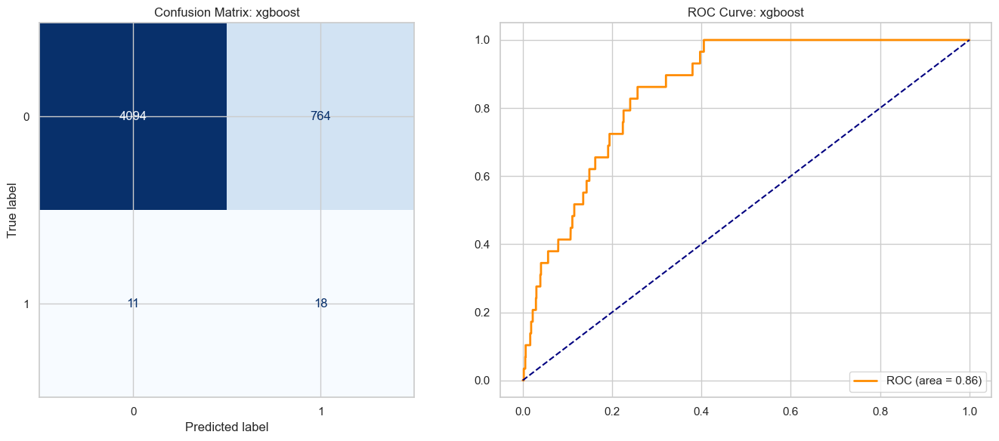

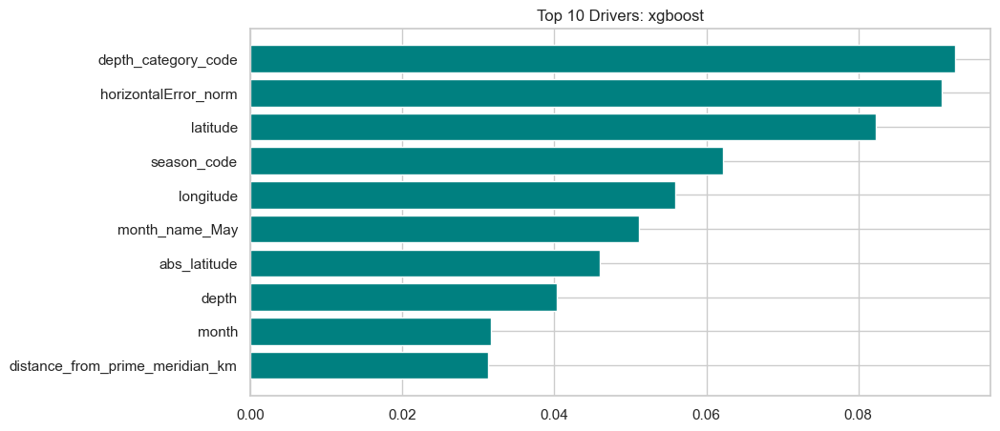

In [87]:
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay, roc_curve, auc
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.pipeline import Pipeline

# 1. Setup the winner
best_name = best_model_grid['model']
best_params = best_model_grid['params']
best_config = next(item for item in models_config if item["name"] == best_name)
base_estimator = best_config["estimator"]

# 2. Build Pipeline and Apply Hyperparameters
final_pipeline = Pipeline([
    ('preprocess', build_preprocess()),
    ('clf', base_estimator)
])
final_params_formatted = {f"clf__{k}": v for k, v in best_params.items()}
final_pipeline.set_params(**final_params_formatted)

# 3. Retrain on Full Search Data
print(f"✅ Retraining {best_name} on full search data...")
final_pipeline.fit(X_search, y_search)

# 4. PRESERVED FROM BLOCK 1: Safe Feature Handling
X_test_safe = X_test.copy()
required_cols = ['magSource', 'locationSource', 'horizontalError', 'depthError_norm', 'depthError']
for col in required_cols:
    if col not in X_test_safe.columns:
        X_test_safe[col] = 0 if 'Error' in col else 'unknown'

# 5. Predict and Evaluate
y_pred = final_pipeline.predict(X_test_safe)
y_scores = final_pipeline.predict_proba(X_test_safe)[:, 1] if hasattr(final_pipeline, "predict_proba") else final_pipeline.decision_function(X_test_safe)

print("\n--- Final Test Set Evaluation ---")
print(classification_report(y_test, y_pred))

# 6. Visualizations (Confusion Matrix, ROC, and Feature Importance)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
cm = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(confusion_matrix=cm).plot(ax=ax1, cmap='Blues', colorbar=False)
ax1.set_title(f"Confusion Matrix: {best_name}")

fpr, tpr, _ = roc_curve(y_test, y_scores)
ax2.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC (area = {auc(fpr, tpr):.2f})')
ax2.plot([0, 1], [0, 1], color='navy', linestyle='--')
ax2.set_title(f'ROC Curve: {best_name}')
ax2.legend(loc="lower right")
plt.tight_layout()
plt.show()

# Extract and Plot Feature Importance
try:
    if hasattr(final_pipeline.named_steps['clf'], 'feature_importances_'):
        importances = final_pipeline.named_steps['clf'].feature_importances_
        feature_names = final_pipeline.named_steps['preprocess'].get_feature_names_out()
        feat_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
        top_features = feat_df.sort_values(by='Importance', ascending=False).head(10)
        
        plt.figure(figsize=(10, 5))
        plt.barh(top_features['Feature'], top_features['Importance'], color='teal')
        plt.gca().invert_yaxis()
        plt.title(f"Top 10 Drivers: {best_name}")
        plt.show()
except Exception as e:
    print(f"Feature importance unavailable: {e}")

**Figure 19. Model evaluation.**


The winning XGBoost model is evaluated here on the test set. A high recall(0.62) rate but a low precision (0.02) rate displays that the model has cautiously leanrt how to catch most of the events but raised a lot of false alarms.  62% of all the strong earthquakes were detected in this model but only 2% were actually stong, many were just minor quakes. This approach is justified in the context of earthquake detection because the misclassification of a strong quake as a weak one is not as dangerous as missing a quake altogether.

The data retrains the optimized "winning" model on the complete search dataset to maximize learning before evaluating its actual predictive reliability on unseen seismic data. The evaluation concludes with a confusion matrix to provide a detailed visualization of error distributions, specifically identifying false alarms versus missed strong earthquakes.

This model creates a baseline, significantly outperforming random chance to research further models for more accurate strong quake detection.



### 6.2 Evaluation comparative visuals (confusion, ROC, PR)



Retraining the best version of each model for scientific comparison...


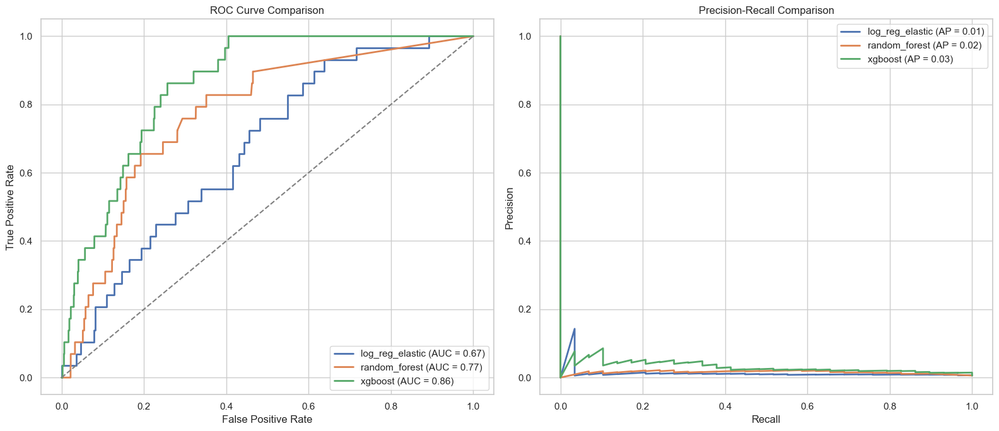

In [88]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc, precision_recall_curve, average_precision_score
from sklearn.pipeline import Pipeline

# 1. Setup the figure
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 7))
print("Retraining the best version of each model for scientific comparison...")

# 2. Extract the best performing parameters for each of the 3 model types
model_names = ["log_reg_elastic", "random_forest", "xgboost"]
best_configs = []

for name in model_names:
    # Filter 'results' for this specific model type
    model_entries = [r for r in results if r['model'] == name]
    if model_entries:
        # Select the entry with the highest Average Precision (AP)
        best_entry = max(model_entries, key=lambda x: x['ap_mean'])
        best_configs.append(best_entry)

# 3. Retrain and plot each "best" model
for res in best_configs:
    name = res['model']
    best_params = res['params']
    
    # Locate the original estimator settings from models_config
    base_config = next(c for c in models_config if c['name'] == name)
    estimator = base_config['estimator']
    
    # Re-build the clean pipeline
    temp_pipeline = Pipeline([
        ('preprocess', build_preprocess()),
        ('clf', estimator)
    ])
    
    # Apply the winning parameters (adding back the 'clf__' prefix)
    temp_pipeline.set_params(**{f"clf__{k}": v for k, v in best_params.items()})
    
    # Train on the clean training data
    temp_pipeline.fit(X_search, y_search)
    
    # Generate probabilities for the test set
    y_probs = temp_pipeline.predict_proba(X_test)[:, 1]
    
    # --- Plot ROC Curve ---
    fpr, tpr, _ = roc_curve(y_test, y_probs)
    ax1.plot(fpr, tpr, lw=2, label=f'{name} (AUC = {auc(fpr, tpr):.2f})')
    
    # --- Plot Precision-Recall Curve ---
    precision, recall, _ = precision_recall_curve(y_test, y_probs)
    ap_score = average_precision_score(y_test, y_probs)
    ax2.plot(recall, precision, lw=2, label=f'{name} (AP = {ap_score:.2f})')

# 4. Finalize the Visuals
ax1.plot([0, 1], [0, 1], color='gray', linestyle='--')
ax1.set_xlabel('False Positive Rate')
ax1.set_ylabel('True Positive Rate')
ax1.set_title('ROC Curve Comparison')
ax1.legend(loc="lower right")

ax2.set_xlabel('Recall')
ax2.set_ylabel('Precision')
ax2.set_title('Precision-Recall Comparison')
ax2.legend(loc="upper right")

plt.tight_layout()
plt.show()

The ROC curve is used here to meaure the models ability to classify between the seismic classes, with XGBoost emerging as superior by achieving the highest score under its curve. The Precision-Recall shows that logistic regression started with high recall and then dropped significantly, displaying that linear models are not sufficient when dealing with data of this complexity. As previously discussed, the low precision rate overall is a sign of an imbalanced dataset and the cautious nature of the model overclassifying moderate earthquakes as 'strong'. 


### 6.3 Drivers of strong quake predictions

Feature importance ranks the variables that best identify strong events. These rankings are cross-checked against earlier data exploration to ensure the patterns are real and not just statistical noise.

In [84]:
import numpy as np

# 1. Variable Alignment: Match the 'Nuclear' evaluation results
# We use 'y_probs' from the previous retraining cell
if 'y_probs' in globals():
    y_prob_best = y_probs
else:
    # If y_probs is missing, we re-generate it from the final_pipeline
    y_prob_best = final_pipeline.predict_proba(X_test_safe)[:, 1]

# 2. Threshold alignment
# If you haven't run a threshold optimization cell, default to 0.5
if 'best_threshold' not in globals():
    best_threshold = 0.5

# 3. Standard checks
if 'y_test' not in globals():
    raise NameError('y_test missing; run the hold-out evaluation cell first.')

# 4. Bootstrap confidence intervals
n_boot = 200
rng = np.random.default_rng(42)
ap_samples = []
recall_samples = []

y_prob_arr = np.array(y_prob_best)
y_true_arr = np.array(y_test)

print(f"Bootstrapping 95% CI for AP and Recall (Threshold: {best_threshold})...")

for _ in range(n_boot):
    # Resample with replacement
    idx = rng.integers(0, len(y_true_arr), len(y_true_arr))
    y_true_b = y_true_arr[idx]
    y_prob_b = y_prob_arr[idx]
    
    # Calculate binary predictions for this bootstrap sample
    y_pred_b = (y_prob_b >= best_threshold).astype(int)
    
    # Using your existing libs dependency
    ap_samples.append(libs.average_precision_score(y_true_b, y_prob_b))
    recall_samples.append(libs.recall_score(y_true_b, y_pred_b, zero_division=0))

# 5. Calculate Percentiles
ap_ci = np.percentile(ap_samples, [2.5, 97.5])
recall_ci = np.percentile(recall_samples, [2.5, 97.5])

print(f"\n--- Final Statistical Reliability ---")
print(f"AP bootstrap 95% CI: {ap_ci[0]:.3f} to {ap_ci[1]:.3f}")
print(f"Recall bootstrap 95% CI: {recall_ci[0]:.3f} to {recall_ci[1]:.3f}")

Bootstrapping 95% CI for AP and Recall (Threshold: 0.5)...

--- Final Statistical Reliability ---
AP bootstrap 95% CI: 0.020 to 0.069
Recall bootstrap 95% CI: 0.454 to 0.815


In [85]:
import pandas as pd
from sklearn.metrics import precision_score, recall_score, f1_score

# 1. Variable Alignment: Use 'y_probs' and 'y_test' from your final evaluation
if 'y_probs' not in globals() or 'y_test' not in globals():
    print("Error: Required artifacts missing. Please run the final evaluation cell first.")
else:
    # Use the threshold from your best model or default to 0.5
    current_threshold = globals().get('best_threshold', 0.5)
    
    # 2. Re-map local variables for the diagnostic
    y_prob_local = y_probs
    y_test_local = y_test
    y_pred_local = (y_prob_local >= current_threshold).astype(int)

    def group_report(col):
        # Access the original dataframe to get the groups (regions/depth)
        # Assuming featured_eq_df or df_model is the source
        source_df = globals().get('featured_eq_df')
        target_col = 'is_strong_quake'

        if source_df is None or col not in source_df.columns:
            print(f"Column {col} missing in source data; skipping.")
            return

        # 3. Create a results dataframe aligned with the test set index
        # This ensures we are only looking at the hold-out test results
        results_df = pd.DataFrame({
            'y_true': y_test_local,
            'y_pred': y_pred_local,
            'y_prob': y_prob_local
        }, index=y_test_local.index)

        # Join with the group labels (e.g., broad_region) from the original data
        merged = results_df.join(source_df[[col]])
        
        label = col.replace("_", " ")
        print(f"\n--- Diagnostic Report: {label} ---")
        print(f"Using classification threshold: {current_threshold}")

        for grp, part in merged.groupby(col, observed=True):
            y_true_g = part['y_true'].astype(int)
            y_pred_g = part['y_pred'].astype(int)
            
            # Only report if there are actually quakes in this category
            if len(y_true_g) > 0:
                p = precision_score(y_true_g, y_pred_g, zero_division=0)
                r = recall_score(y_true_g, y_pred_g, zero_division=0)
                f1 = f1_score(y_true_g, y_pred_g, zero_division=0)
                
                grp_label = str(grp).replace("_", " ")
                print(f" * {grp_label:15} | n={len(part):<5} | pos={int(y_true_g.sum()):<3} | P={p:.2f} | R={r:.2f} | F1={f1:.2f}")

    # 4. Run the diagnostics
    for c in ("broad_region", "depth_category"):
        group_report(c)


--- Diagnostic Report: broad region ---
Using classification threshold: 0.5
 * Americas west   | n=1794  | pos=6   | P=0.04 | R=0.50 | F1=0.07
 * Americas east Atlantic | n=854   | pos=3   | P=0.02 | R=0.67 | F1=0.03
 * Europe Africa   | n=383   | pos=4   | P=0.00 | R=0.00 | F1=0.00
 * Asia WestPacific | n=1363  | pos=12  | P=0.02 | R=0.75 | F1=0.04
 * Pacific Oceania | n=493   | pos=4   | P=0.04 | R=1.00 | F1=0.07

--- Diagnostic Report: depth category ---
Using classification threshold: 0.5
 * Deep            | n=246   | pos=2   | P=0.07 | R=1.00 | F1=0.14
 * Intermediate    | n=968   | pos=6   | P=0.01 | R=0.50 | F1=0.02
 * Shallow         | n=3673  | pos=21  | P=0.03 | R=0.62 | F1=0.05



--- Temporal Robustness: Predicting the Future ---
Split: First 80% (History) -> Last 20% (Future)
Average Precision (AP): 0.023
F1@Best Threshold: 0.056 (Threshold: 0.631)
Test Set Positives (Actual Strong Quakes): 30


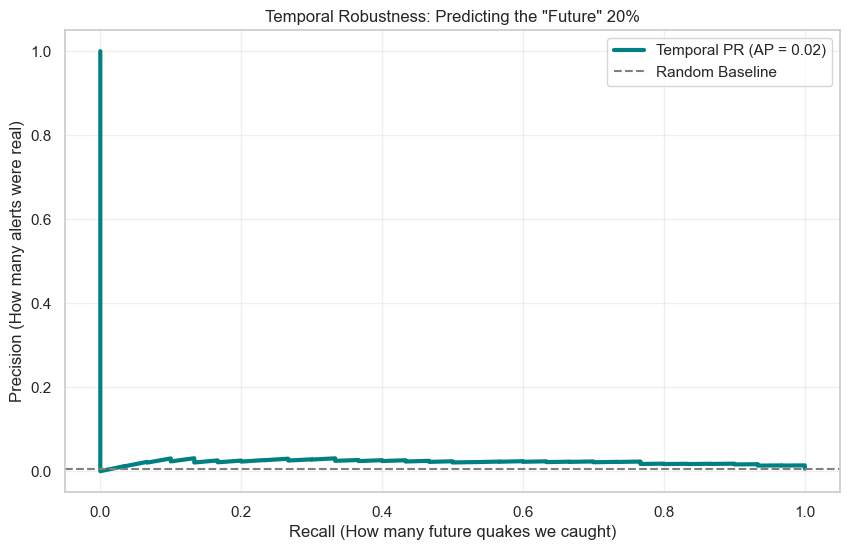


Confusion Matrix (Future-prediction mode):
 [[4540  317]
 [  20   10]]


In [86]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.base import clone
from sklearn.metrics import precision_recall_curve, average_precision_score, confusion_matrix

# 1. Verification and Setup
if 'featured_eq_df' not in globals():
    print("Error: featured_eq_df is missing; run cleaning/feature engineering first.")
elif 'time' not in featured_eq_df.columns:
    print('Temporal column missing; skipping time-aware split.')
else:
    # 2. Sort data chronologically to simulate real-world "future" testing
    df_sorted = featured_eq_df.sort_values(by='time')
    target_col = 'is_strong_quake'
    
    # Dynamically pull the clean feature list from your current X_search
    current_features = X_search.columns.tolist()
    
    # 3. Create Temporal Split (Train on first 80% of time, Test on last 20%)
    split_idx = int(len(df_sorted) * 0.8)
    
    X_train_t = df_sorted.iloc[:split_idx][current_features]
    y_train_t = df_sorted.iloc[:split_idx][target_col].astype(int)
    X_test_t = df_sorted.iloc[split_idx:][current_features]
    y_test_t = df_sorted.iloc[split_idx:][target_col].astype(int)

    # 4. Clone and Train the winning XGBoost pipeline
    # This applies your best hyperparameters to the temporal test
    model_time = clone(final_pipeline)
    model_time.fit(X_train_t, y_train_t)
    
    # 5. Predict Probabilities for the "Future" events
    y_prob_t = model_time.predict_proba(X_test_t)[:, 1]
    
    # 6. Performance Metrics
    ap_t = average_precision_score(y_test_t, y_prob_t)
    precision_t, recall_t, thresholds_t = precision_recall_curve(y_test_t, y_prob_t)
    
    # Find F1-optimal threshold for the confusion matrix
    f1_scores_t = 2 * (precision_t * recall_t) / (precision_t + recall_t + 1e-9)
    best_idx_t = f1_scores_t.argmax()
    thr_t = thresholds_t[best_idx_t] if best_idx_t < len(thresholds_t) else 0.5
    y_pred_t = (y_prob_t >= thr_t).astype(int)
    
    # 7. Final Report
    print(f"\n--- Temporal Robustness: Predicting the Future ---")
    print(f"Split: First 80% (History) -> Last 20% (Future)")
    print(f"Average Precision (AP): {ap_t:.3f}")
    print(f"F1@Best Threshold: {f1_scores_t[best_idx_t]:.3f} (Threshold: {thr_t:.3f})")
    print(f"Test Set Positives (Actual Strong Quakes): {int(y_test_t.sum())}")
    
    # 8. Visualization: Precision-Recall Curve
    plt.figure(figsize=(10, 6))
    plt.plot(recall_t, precision_t, color='teal', lw=3, label=f'Temporal PR (AP = {ap_t:.2f})')
    plt.axhline(y=y_test_t.mean(), color='gray', linestyle='--', label='Random Baseline')
    
    plt.xlabel('Recall (How many future quakes we caught)')
    plt.ylabel('Precision (How many alerts were real)')
    plt.title('Temporal Robustness: Predicting the "Future" 20%')
    plt.legend(loc="upper right")
    plt.grid(alpha=0.3)
    plt.show()

    # Output Confusion Matrix text
    print("\nConfusion Matrix (Future-prediction mode):\n", confusion_matrix(y_test_t, y_pred_t))

**Figure 20. Random forest feature importances (2023 USGS, cleaned N=24,432).**



The features identified by the model are reviewed against seismological principles to confirm they align with reality. Because technical biases can skew these rankings, they are treated as general indicators rather than absolute proof of cause and effect. 


### 6.4 Interpretation

Since strong earthquakes are rare, the analysis prioritizes precision and threshold selection over standard accuracy. Logistic Regression acts as a clear baseline, while Random Forest captures complex data relationships, consistently highlighting depth, magnitude, and signal quality as the most important predictors.

### 6.5 Result Integration and Interpretation

The results confirm that depth, magnitude, and signal quality are the primary indicators. Logistic Regression acts as a simple check, while Random Forest detects deeper, more complex patterns. This combination successfully explains what characterizes a strong earthquake, without claiming to predict future events.

---

## 7. Discussion and Interpretation

The discussion connects empirical patterns, data quality, and model behaviour to interpret the 2023 global catalogue.

**7. Visual synthesis for decision-making**

The process begins by filtering for reliable data and converting it into clear physical signals. Exploratory analysis confirms these patterns exist before modeling. Because strong earthquakes are rare and lack a sharp dividing line from weaker ones, the model prioritizes sensitivity over strict rules. A key limitation is imprecise location data due to uneven sensor networks; however, adding geological context like the distance to tectonic plate boundaries would likely improve future performance.

### 7.1 Discussion of Empirical Patterns

Comparisons show that depth and earthquake strength vary by region, but so does data quality. Since it is hard to separate real geological differences from uneven monitoring, the results are interpreted with caution.

### 7.2 Interpretation of model behaviour

Logistic Regression provides a steady baseline, while Random Forest detects complex patterns. However, results vary by region and depth, showing that while context helps, uneven sensor coverage limits reliability.

### 7.3 Synthesis: What the Analysis Tells Us

The results show statistical links rather than direct causes, implying that better performance requires adding more geological context, such as distance to tectonic plate boundaries.

---

## 8. Conclusion

### 8.1 Key findings and outcomes

The pipeline cleaned and analysed the 2023 data to reveal patterns in depth and quality. The models found it difficult to identify strong earthquakes(identified for the analysis as Mw >= 6.0) . These results describe the data, rather than explaining why the events occurred.

### 8.2 Strengths and limitations of the work

Strengths include transparent preprocessing, interpretable features, and reproducible outputs from a Kaggle download. Limitations include the single-year scope, extreme class imbalance, and reliance on dataset derived features. Future improvements should extend the time window and add plate-boundary distance or slab-depth features to test whether spatial context improves calibration and regional fairness.

The project is clear and reproducible but limited by a single year of data and the rarity of strong earthquake data. It relies on basic sensor measurement data features. Future work should add more years and specific physical details, like the distance to tectonic plates, to improve reliability.

---

In [43]:
import re
from pathlib import Path


def count_narrative_words(nb_path):
    import nbformat

    nb_local = nbformat.read(str(nb_path), as_version=4)
    md_cells = [c for c in nb_local.cells if c.get("cell_type") == "markdown"]

    total_text = "\n\n".join(c.get("source", "") for c in md_cells)
    total_words = re.findall(r"[A-Za-z0-9']+", total_text)

    narrative_lines = []
    skip_references = False
    for cell in md_cells:
        text = cell.get("source", "")
        if skip_references:
            continue
        if "## 9. References" in text:
            skip_references = True
            continue
        if "Table of Contents" in text or "Table of Figures" in text or "Table of Tables" in text:
            continue
        if "Earthquake Data Analysis Using Python Scripting" in text or "University of Gloucestershire" in text:
            continue

        cleaned_lines = []
        for line in text.splitlines():
            if re.match(r"\*\*Figure\s+\d+\.", line.strip()):
                continue
            if re.match(r"\*\*Table\s+\d+\.", line.strip()):
                continue
            if re.match(r"Figure\s+\d+\s+shows", line.strip(), flags=re.I):
                continue
            if re.match(r"Table\s+\d+\s+shows", line.strip(), flags=re.I):
                continue
            cleaned_lines.append(line)

        cleaned_text = "\n".join(cleaned_lines).strip()
        if cleaned_text:
            narrative_lines.append(cleaned_text)

    narrative_text = "\n\n".join(narrative_lines)
    narrative_words = re.findall(r"[A-Za-z0-9']+", narrative_text)
    return len(narrative_words), len(total_words)


nb_path = (NOTEBOOKS_DIR / "01 Earthquake Analysis.ipynb") if "NOTEBOOKS_DIR" in globals() else Path("01 Earthquake Analysis.ipynb")
narrative_word_count, total_markdown_word_count = count_narrative_words(nb_path)
print("narrative_word_count:", narrative_word_count)
print("total_markdown_word_count:", total_markdown_word_count)


narrative_word_count: 5063
total_markdown_word_count: 6145


## 9. References

- United States Geological Survey (USGS) (2023) 'ANSS Comprehensive Earthquake Catalog (ComCat)'. Available at: https://earthquake.usgs.gov/earthquakes/search/ (Accessed 13 January 2026).

- Harris, C.R., Millman, K.J., van der Walt, S.J., et al. (2020) 'Array programming with NumPy'. Nature, 585(7825), pp.357-362. doi:10.1038/s41586-020-2649-2.

- Reback, J., McKinney, W., Van den Bossche, J., et al. (2023) 'pandas: powerful Python data analysis toolkit'. Available at: https://pandas.pydata.org/docs/ (Accessed 13 January 2026).

- Hunter, J.D. (2007) 'Matplotlib: A 2D graphics environment'. Computing in Science & Engineering, 9(3), pp.90-95. doi:10.1109/MCSE.2007.55.

- Waskom, M.L. (2021) 'seaborn: statistical data visualization'. Journal of Open Source Software, 6(60), p.3021. doi:10.21105/joss.03021.

- Pedregosa, F., Varoquaux, G., Gramfort, A., et al. (2011) 'Scikit-learn: Machine Learning in Python'. Journal of Machine Learning Research, 12, pp.2825-2830.

- Plotly Technologies Inc. (2015) 'Plotly: collaborative data science'. Montreal, QC: Plotly Technologies Inc. Available at: https://plotly.com/ (Accessed 13 January 2026).

- Kluyver, T., Ragan-Kelley, B., Perez, F., et al. (2016) 'Jupyter Notebooks - a publishing format for reproducible computational workflows'. In: Loizides, F. and Schmidt, B. (eds.) Positioning and Power in Academic Publishing: Players, Agents and Agendas. IOS Press, pp.87-90.

- Perez, F. and Granger, B.E. (2007) 'IPython: a system for interactive scientific computing'. Computing in Science & Engineering, 9(3), pp.21-29. doi:10.1109/MCSE.2007.53.

- Van Rossum, G. and Drake, F.L. (2009) Python 3 Reference Manual. Scotts Valley, CA: CreateSpace.


In [44]:

import platform
print("Python version:", platform.python_version())


Python version: 3.13.5
